# Conclave

In [1]:
import sys
import os
sys.path.append(os.path.abspath("..\\.."))
from Modules.latentspacemodel import *
from Modules.inference import *
from Modules.afteranalyses import *

## Network

In [2]:
import pandas as pd
import networkx as nx
from networkx.algorithms import bipartite


xls = pd.ExcelFile(r"C:\Users\carlo\OneDrive\Documents\Latentspacemodels_Networks\Complement\Examples\Conclave\formal.xlsx")
edges = pd.read_excel(xls, "Edges")
nodes = pd.read_excel(xls, "Nodes")
edges.columns = ["Person", "Membership"]
nodes.columns = ["Node", "Type"]
edges["Person"] = edges["Person"].str.strip()
edges["Membership"] = edges["Membership"].str.strip()
nodes["Node"] = nodes["Node"].str.strip()
nodes["Type"] = nodes["Type"].str.strip().str.lower()
B = nx.Graph()
for _, row in nodes.iterrows():
    B.add_node(row["Node"], bipartite=row["Type"], node_type=row["Type"])
for _, row in edges.iterrows():
    B.add_edge(row["Person"], row["Membership"])
cardinals = nodes.loc[nodes["Type"] == "person", "Node"].tolist()
G_weighted = bipartite.weighted_projected_graph(B, cardinals)
G = nx.Graph()
G.add_nodes_from(G_weighted.nodes())
G.add_edges_from(G_weighted.edges())
largest_cc = max(nx.connected_components(G), key=len)
G = G.subgraph(largest_cc).copy()
Y = nx.to_numpy_array(G)
n = np.shape(Y)[0]
print(G)

Graph with 136 nodes and 2791 edges


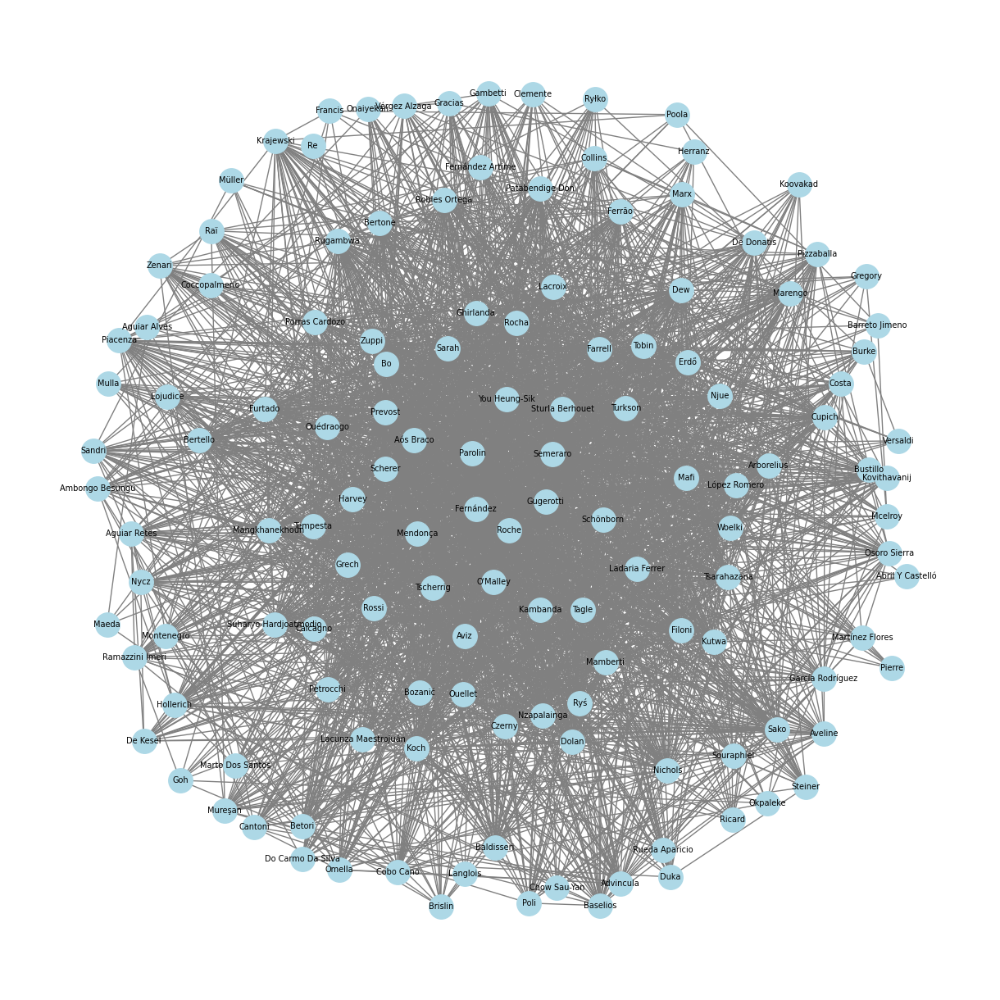

In [3]:
pos = nx.spring_layout(G, k=2.25,seed=0)
plt.figure(figsize=(12,12))
nx.draw(G, pos=pos, with_labels=True,  node_color="lightblue", edge_color="gray", node_size=450, font_size=7)
plt.show()

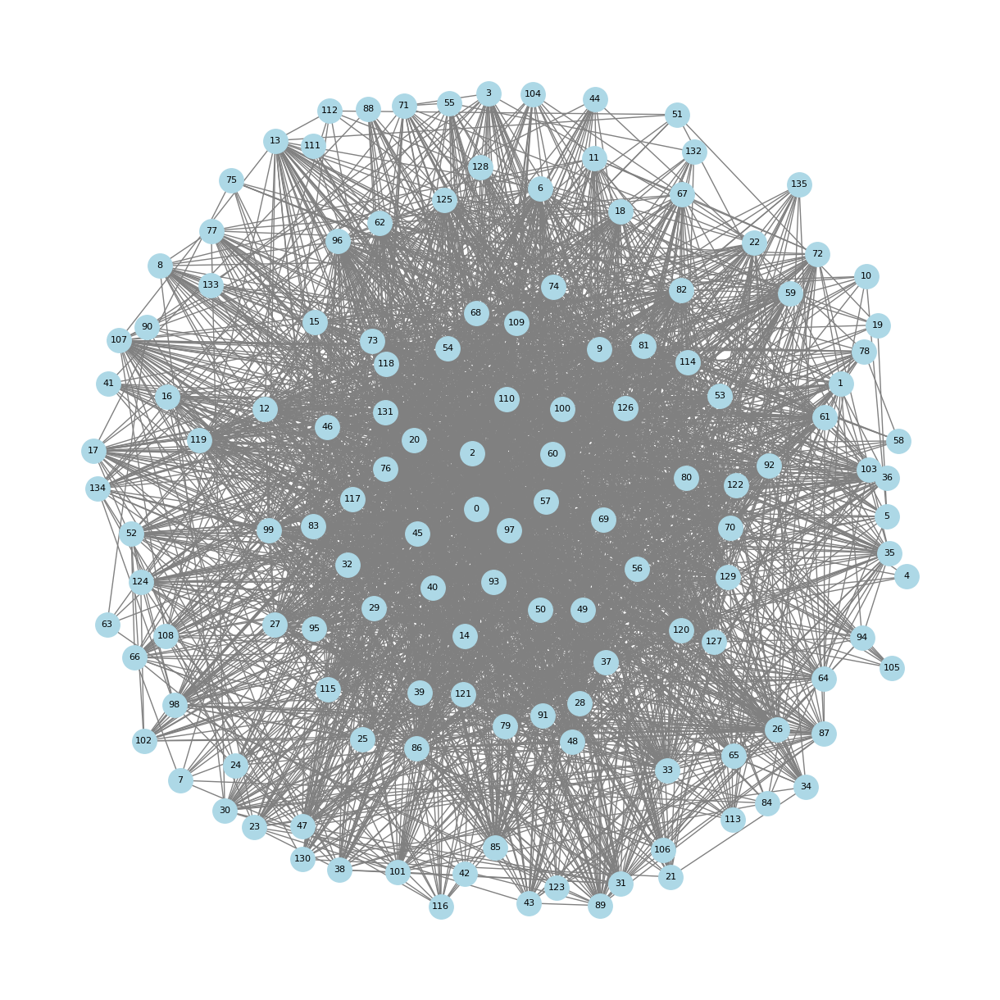

      ID          Cardinal
0      0         Fernández
1      1             Costa
2      2           Parolin
3      3          Gambetti
4      4  Abril Y Castelló
..   ...               ...
131  131           Prevost
132  132           Herranz
133  133     Coccopalmerio
134  134   Ambongo Besungu
135  135          Koovakad

[136 rows x 2 columns]


In [4]:
node_mapping = {
    node:i
    for i,node in enumerate(G.nodes())
}

G_num = nx.relabel_nodes(
    G,
    node_mapping
)

pos_num = {
    node_mapping[k]:v
    for k,v in pos.items()
}

plt.figure(figsize=(12,12))

nx.draw(
    G_num,
    pos=pos_num,
    with_labels=True,
    node_color="lightblue",
    edge_color="gray",
    node_size=450,
    font_size=8
)

plt.show()

mapping_df = pd.DataFrame({
    "ID":list(node_mapping.values()),
    "Cardinal":list(node_mapping.keys())
}).sort_values("ID")

print(mapping_df)

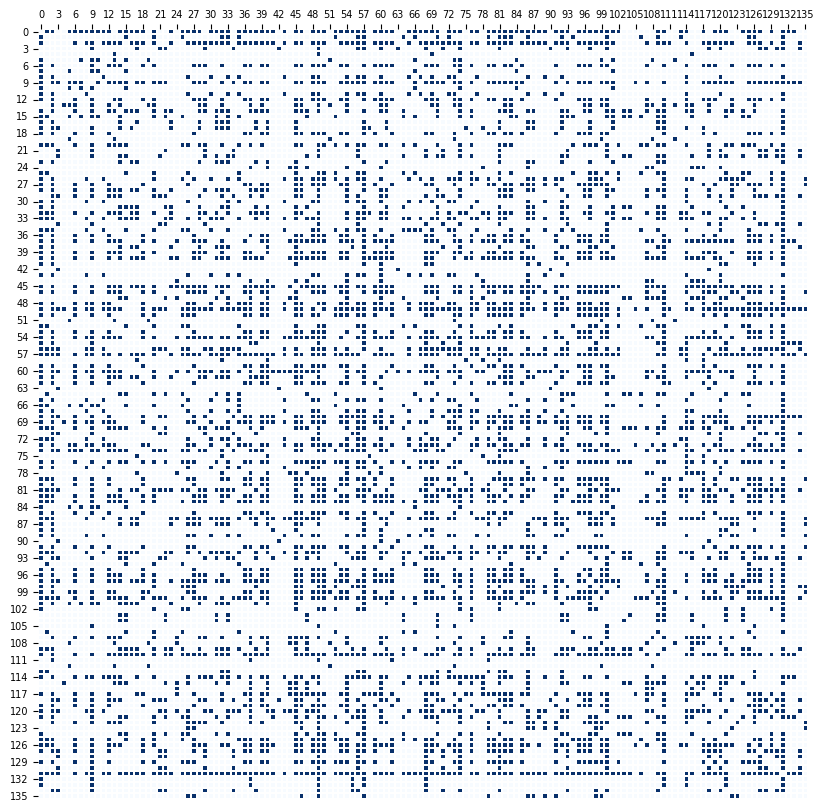

In [5]:
Y = nx.to_numpy_array(
    G_num,
    dtype=int
)

n = Y.shape[0]

plt.figure(figsize=(10,10))

sns.heatmap(
    Y,
    cmap="Blues",
    square=True,
    cbar=False,
    linewidths=0.15,
    linecolor="white"
)

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.gca().xaxis.tick_top()

plt.gca().tick_params(
    top=True,
    bottom=False,
    labeltop=True,
    labelbottom=False,
    labelsize=7
)

plt.show()

In [6]:
seed_MAP = 42
diam = 10.0
n = Y.shape[0]
lr_MAP = 1e-2
n_starts_MAP = 1
n_iter_MAP = 25000
n_sim_iv = 2500
n_iter_cv = 1000
n_folds_cv = 5

## Models over $\mathbb{R}^d$

### Model $\mathbb{R^1}$

#### Without weights

Multi_start (1)


MAP:  18%|█▊        | 4461/25000 [00:24<01:53, 181.03it/s, logpost=-4472.7041, loglik=-4472.1045, logprior=-0.5996, ||grad||=0.0141, patience=100]


[STOP] Early stopping at iter 4460 (no improvement in 101 steps)

Best log-posterior: -4472.7041


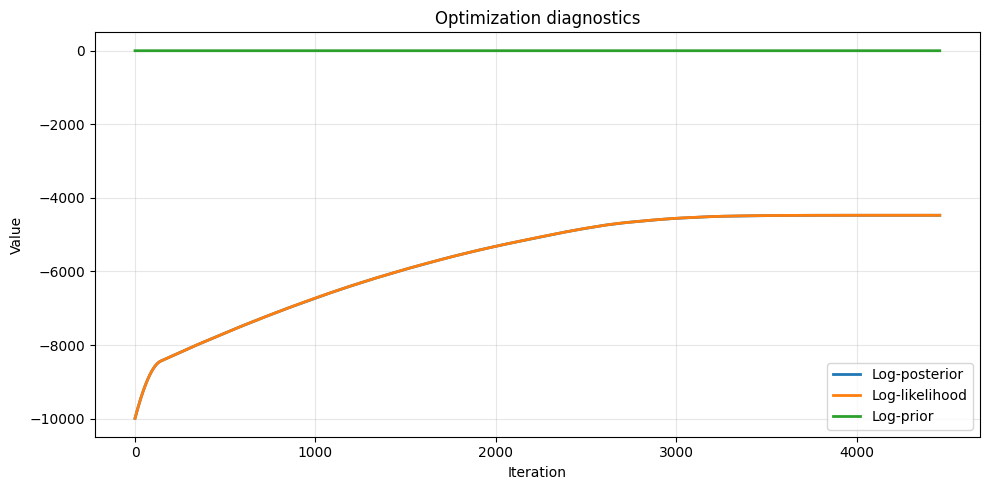

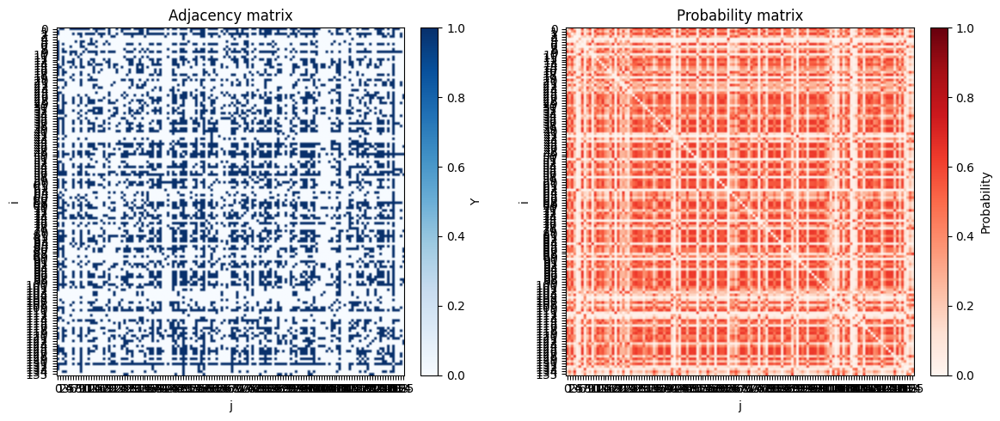

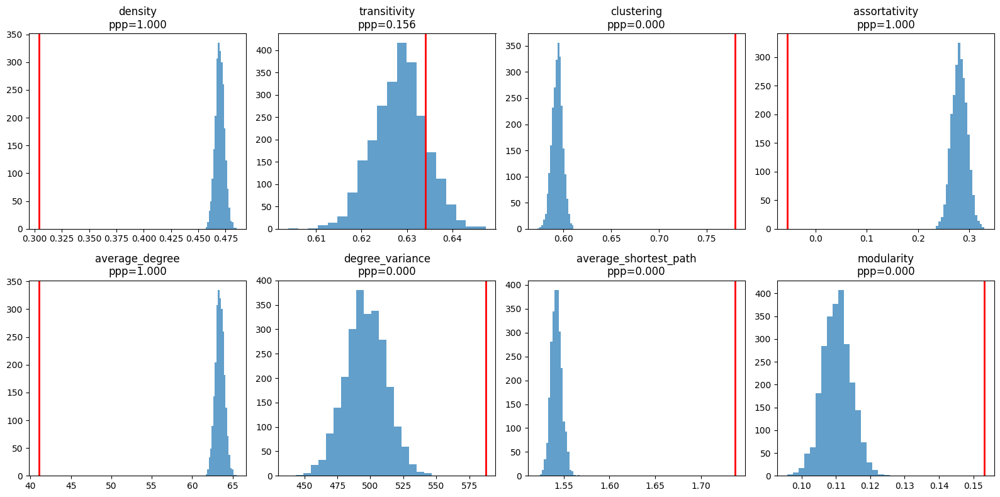

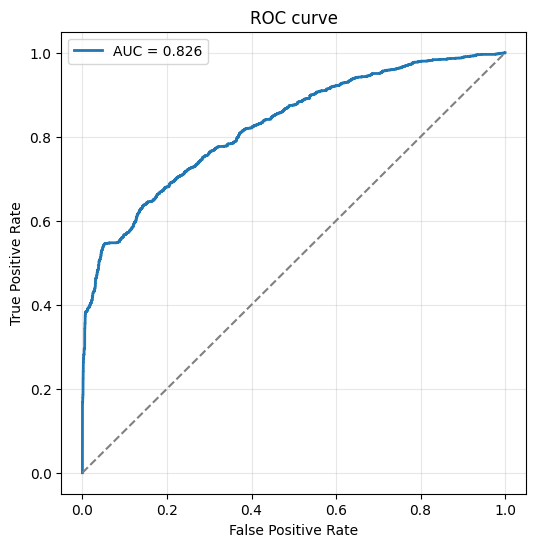

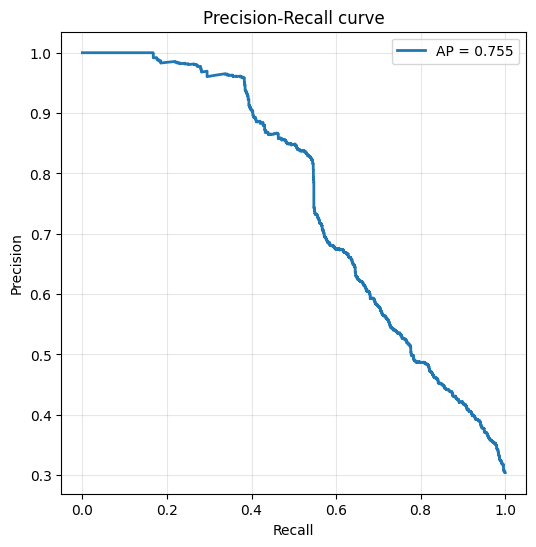

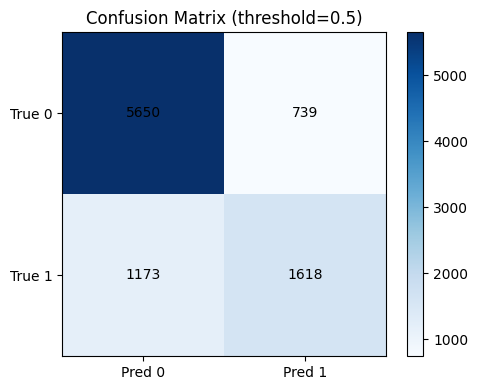

MAP: 100%|██████████| 1000/1000 [00:04<00:00, 219.15it/s, logpost=-3580.5217, loglik=-3579.9180, logprior=-0.6038, ||grad||=0.0141, patience=8]


{'mean_auc': 0.8129840767629947, 'std_auc': 0.010082685415015823, 'min_auc': np.float64(0.7936492957254202), 'max_auc': np.float64(0.8214857438346141), 'n_folds': 5}


In [8]:
geometry = EuclideanGeometry(d=1, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_R1_c.pkl")

#### With weights

Multi_start (1)


MAP:  23%|██▎       | 5773/25000 [00:17<00:58, 329.41it/s, logpost=-4113.6738, loglik=-4113.6738, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 5772 (no improvement in 101 steps)

Best log-posterior: -4113.6738


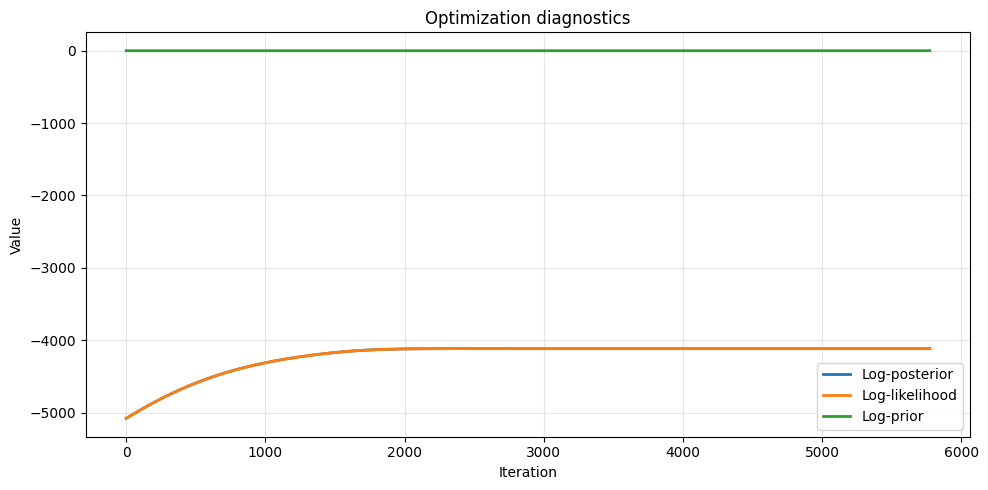

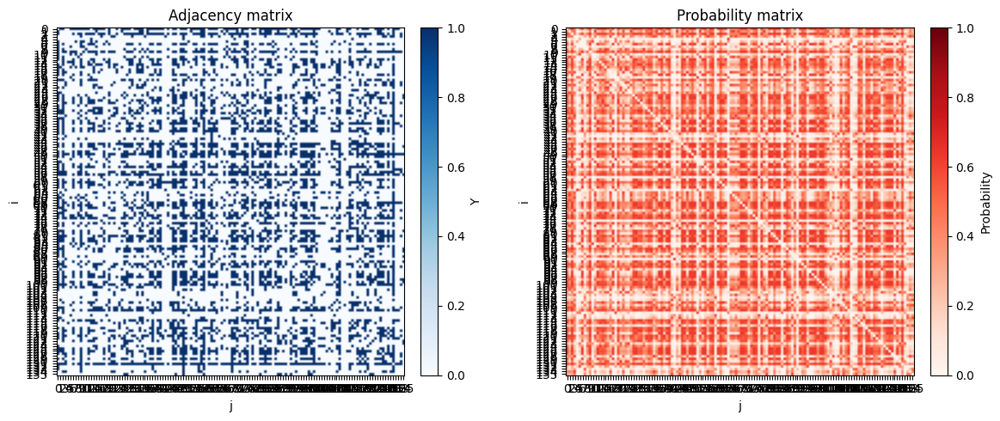

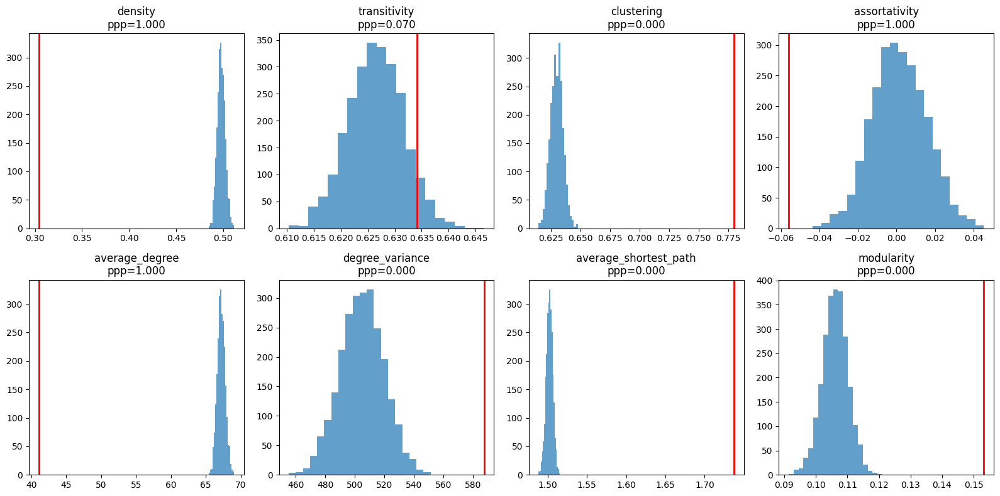

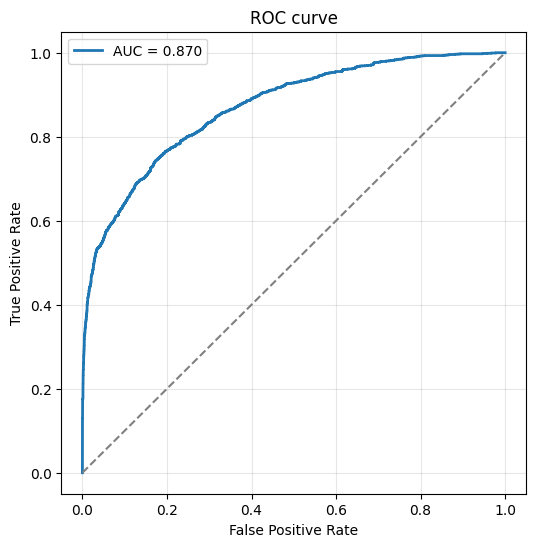

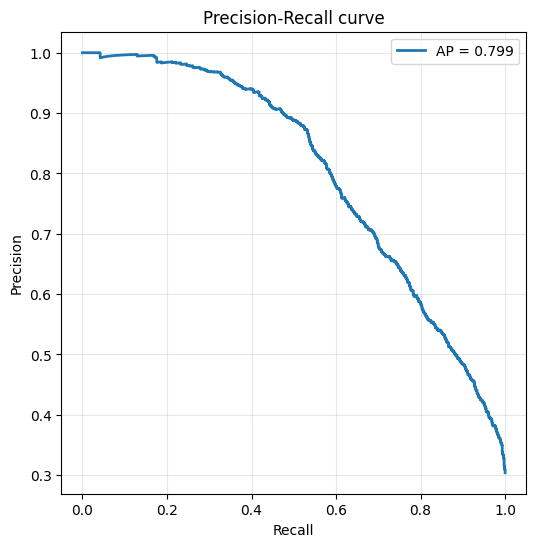

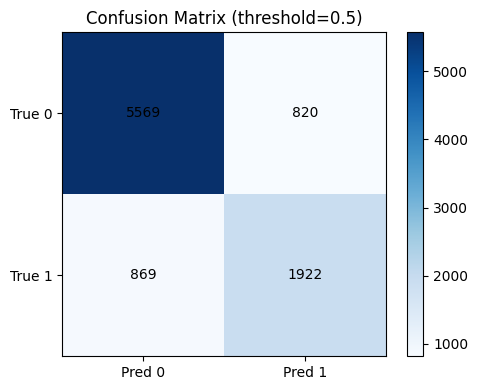

MAP: 100%|██████████| 1000/1000 [00:03<00:00, 300.73it/s, logpost=-3286.4771, loglik=-3286.4771, logprior=0.0000, ||grad||=0.0100, patience=1]


{'mean_auc': 0.8613120564889494, 'std_auc': 0.008721066516890029, 'min_auc': np.float64(0.8467456572646884), 'max_auc': np.float64(0.8702738460015074), 'n_folds': 5}


In [9]:
geometry = EuclideanGeometry(d=1, D=diam)
alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_R1_p.pkl")

### Model $\mathbb{R}^2$

#### Without weigths

Multi_start (1)


MAP: 100%|██████████| 25000/25000 [02:13<00:00, 186.95it/s, logpost=-3364.9917, loglik=-3363.4065, logprior=-1.5853, ||grad||=0.0141, patience=2] 



Best log-posterior: -3364.9917


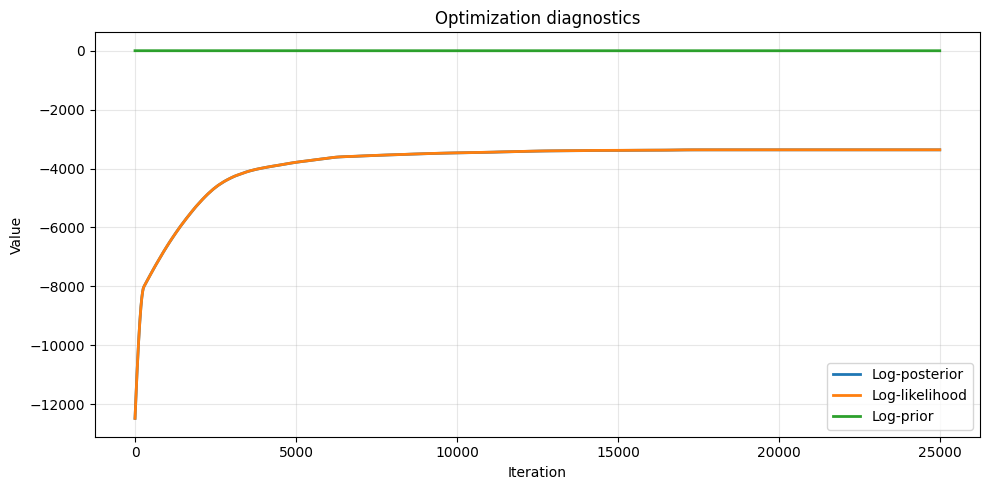

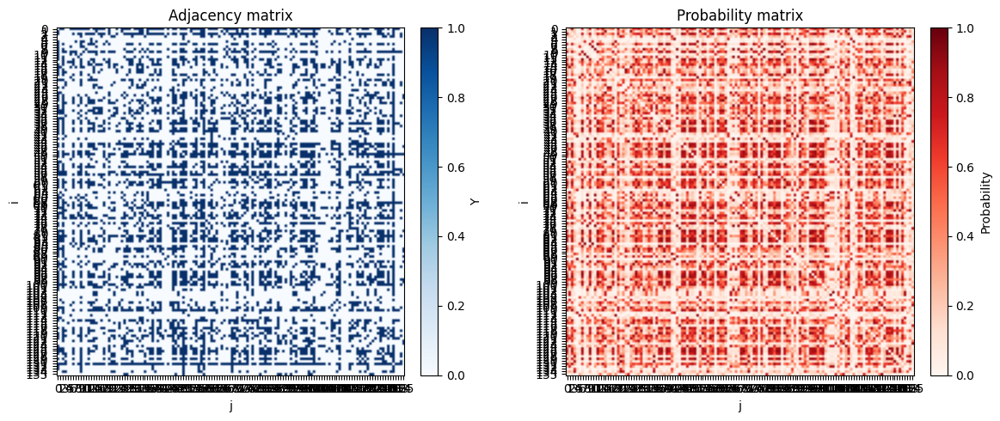

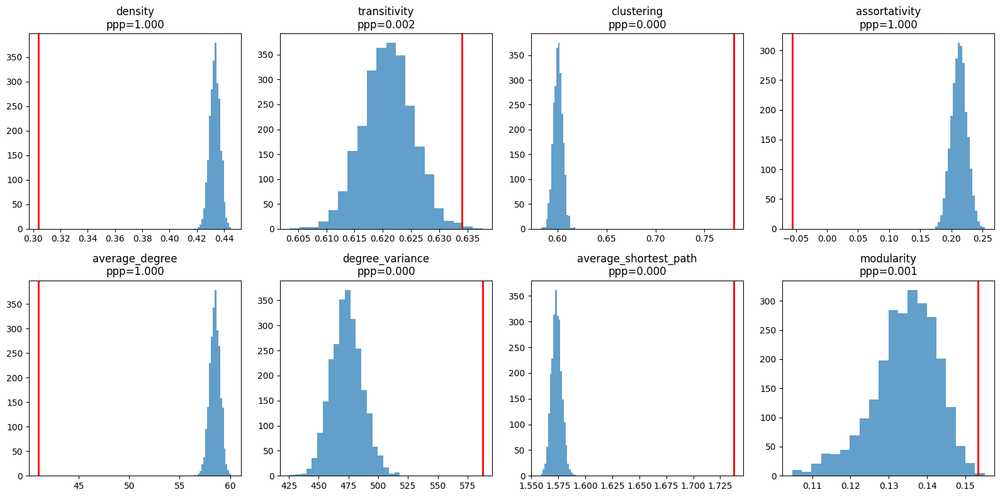

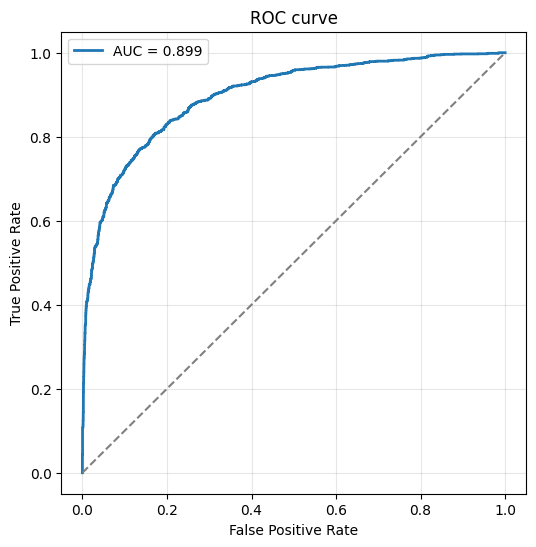

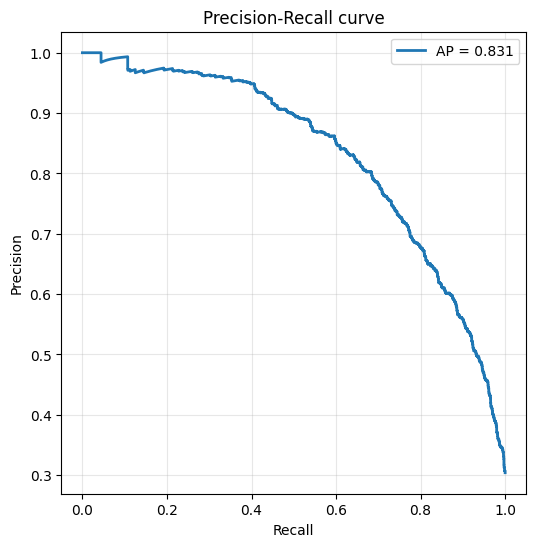

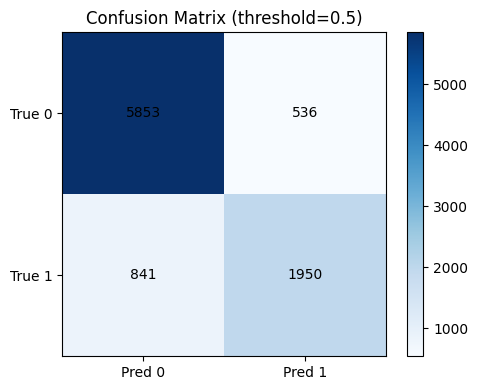

MAP: 100%|██████████| 1000/1000 [00:04<00:00, 214.97it/s, logpost=-2688.3022, loglik=-2686.6865, logprior=-1.6157, ||grad||=0.0141, patience=1]


{'mean_auc': 0.8810537309515689, 'std_auc': 0.007028630767658182, 'min_auc': np.float64(0.8708440809478871), 'max_auc': np.float64(0.8904987319906922), 'n_folds': 5}


In [10]:
geometry = EuclideanGeometry(d=2, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_R2_c.pkl")

#### With weights

Multi_start (1)


MAP:  18%|█▊        | 4614/25000 [00:16<01:14, 271.98it/s, logpost=-3001.4019, loglik=-3001.4019, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 4613 (no improvement in 101 steps)

Best log-posterior: -3001.4019


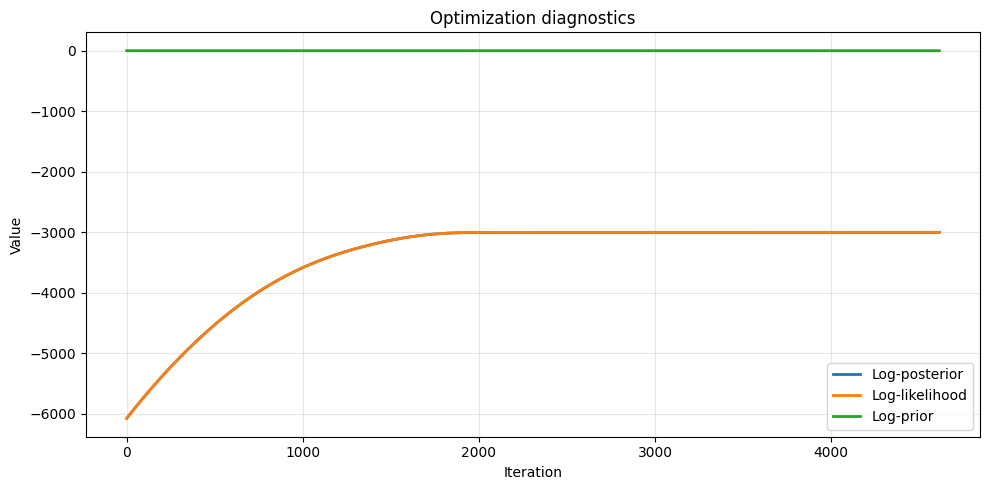

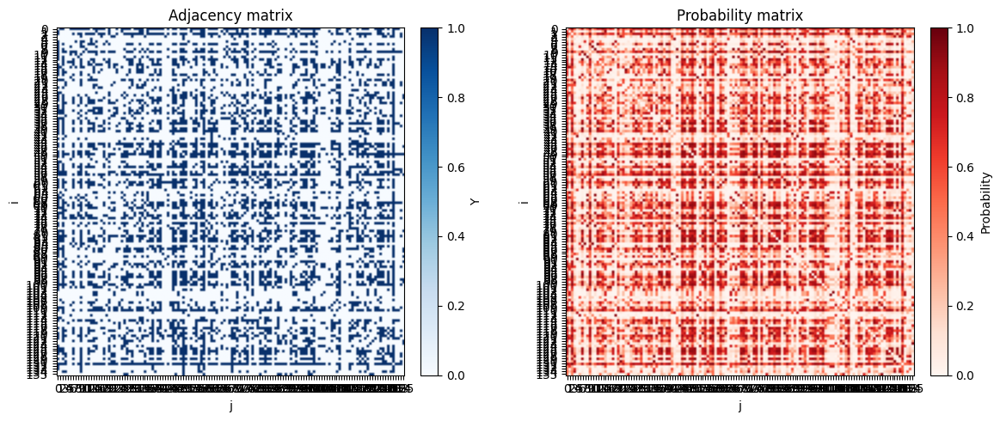

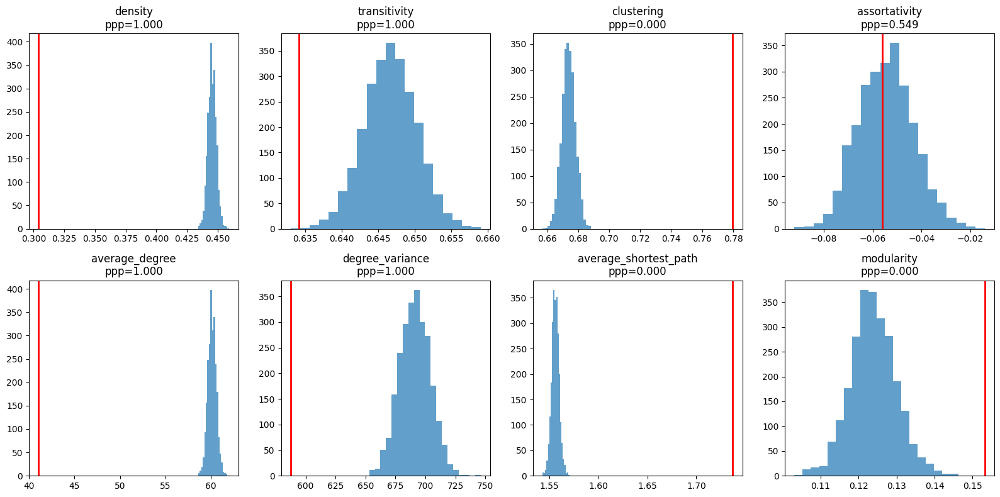

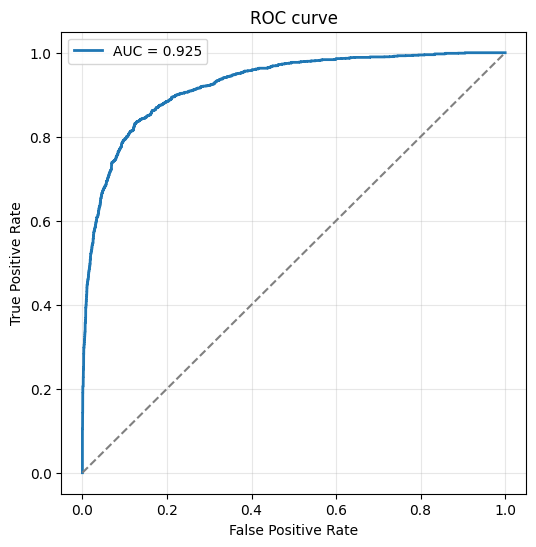

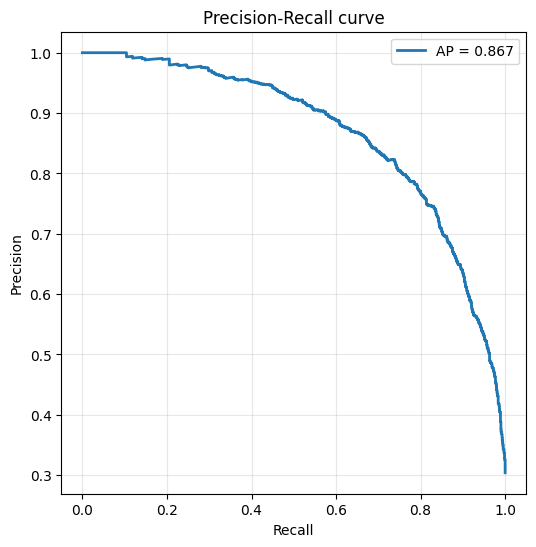

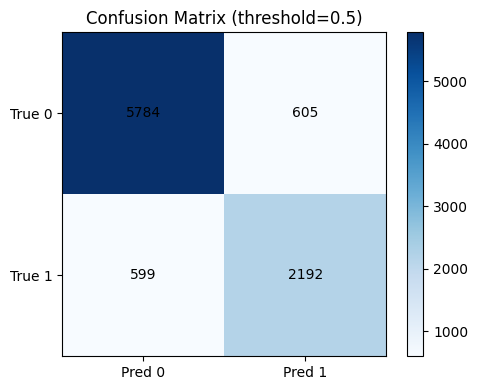

MAP: 100%|██████████| 1000/1000 [00:04<00:00, 212.11it/s, logpost=-2400.4072, loglik=-2400.4072, logprior=0.0000, ||grad||=0.0100, patience=6]


{'mean_auc': 0.9175427437125411, 'std_auc': 0.005515172675287665, 'min_auc': np.float64(0.908488343644053), 'max_auc': np.float64(0.924769365335211), 'n_folds': 5}


In [11]:
geometry = EuclideanGeometry(d=2, D = diam)
alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_R2_p.pkl")

### Model $\mathbb{R}^3$

#### Without weights

Multi_start (1)


MAP: 100%|██████████| 25000/25000 [03:14<00:00, 128.80it/s, logpost=-2902.5129, loglik=-2900.0989, logprior=-2.4141, ||grad||=0.0141, patience=1]



Best log-posterior: -2902.5129


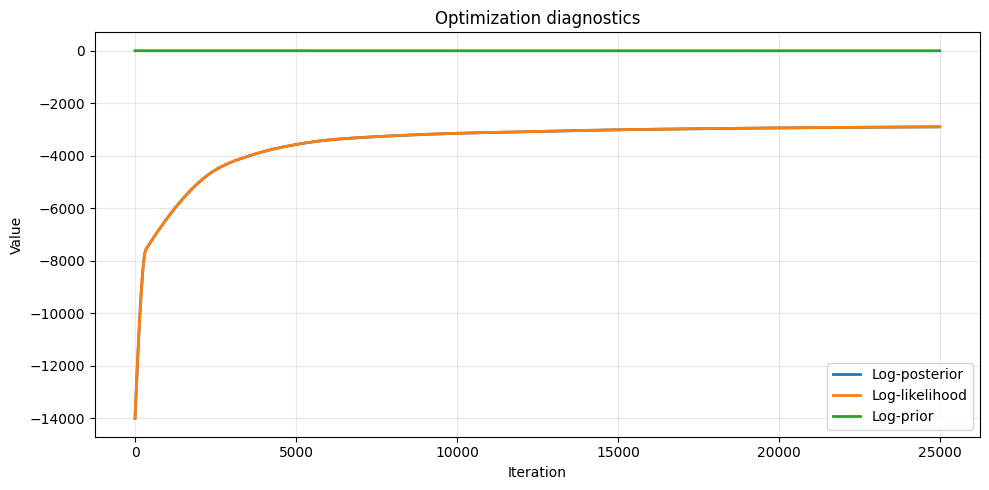

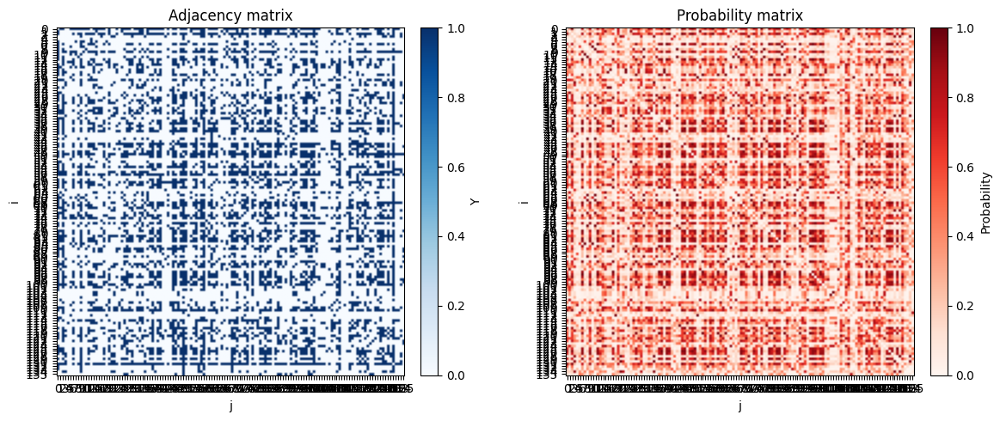

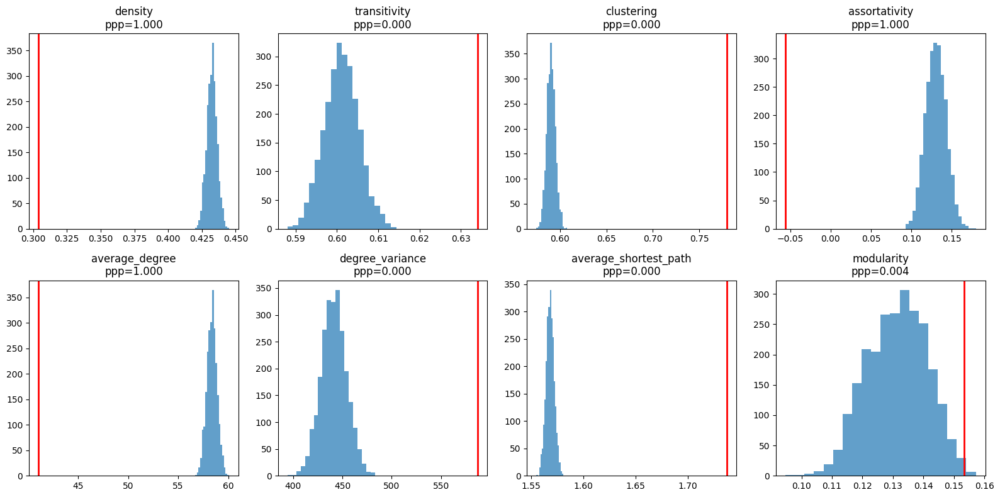

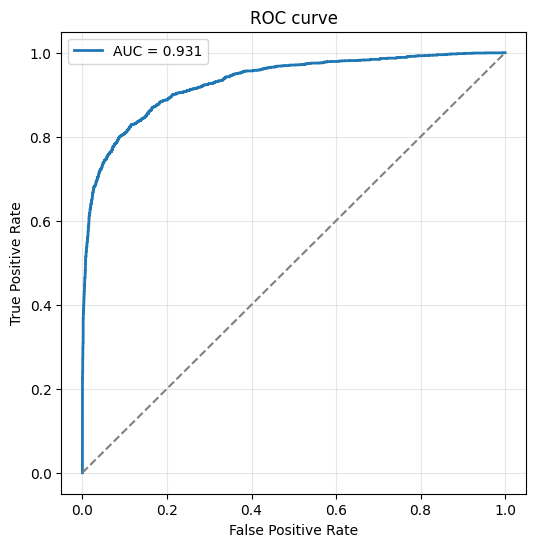

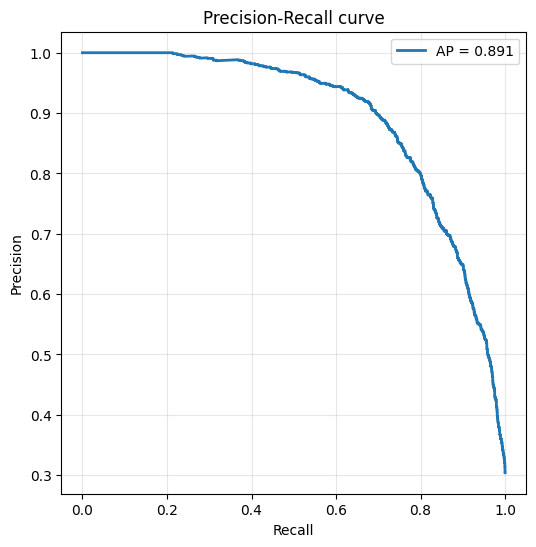

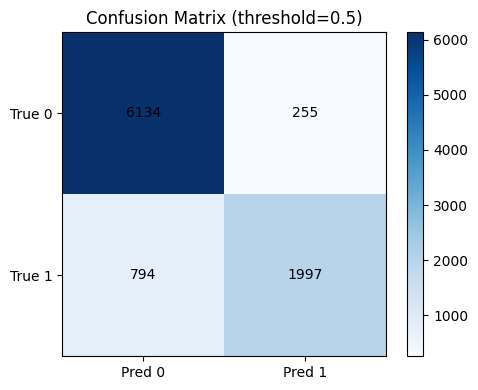

MAP: 100%|██████████| 1000/1000 [00:15<00:00, 65.28it/s, logpost=-2317.5120, loglik=-2315.0730, logprior=-2.4388, ||grad||=0.0141, patience=0]


{'mean_auc': 0.9159794424395912, 'std_auc': 0.003429308429311268, 'min_auc': np.float64(0.9122743000943694), 'max_auc': np.float64(0.9214278017628423), 'n_folds': 5}


In [12]:
geometry = EuclideanGeometry(d=3, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_R3_c.pkl")

#### With weights

Multi_start (1)


MAP:  11%|█         | 2712/25000 [00:31<04:17, 86.54it/s, logpost=-2592.4587, loglik=-2592.4587, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 2711 (no improvement in 101 steps)

Best log-posterior: -2592.4587


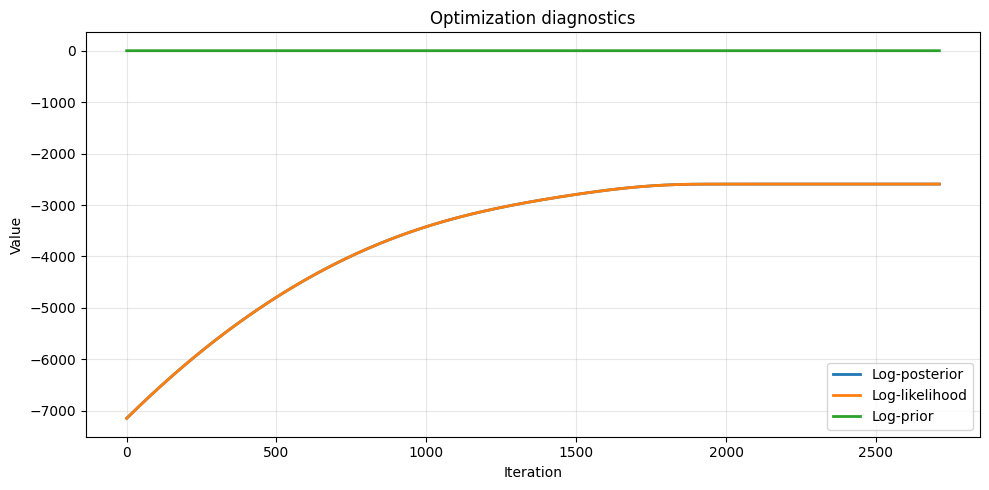

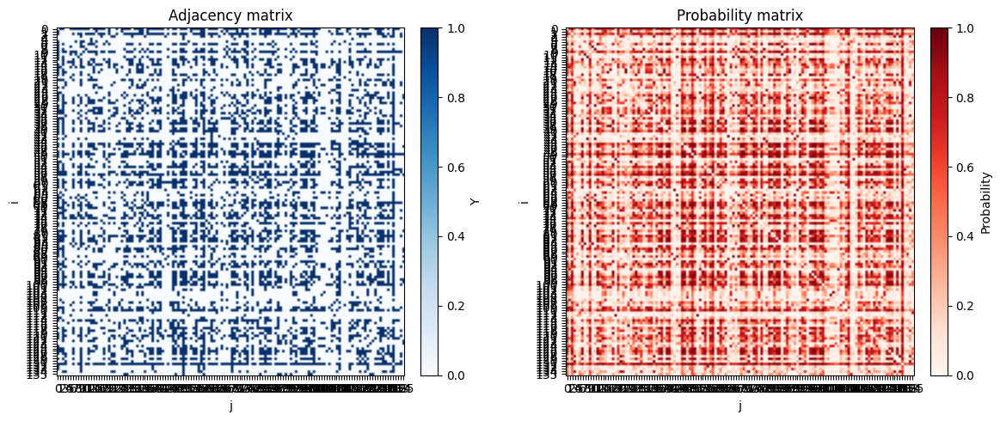

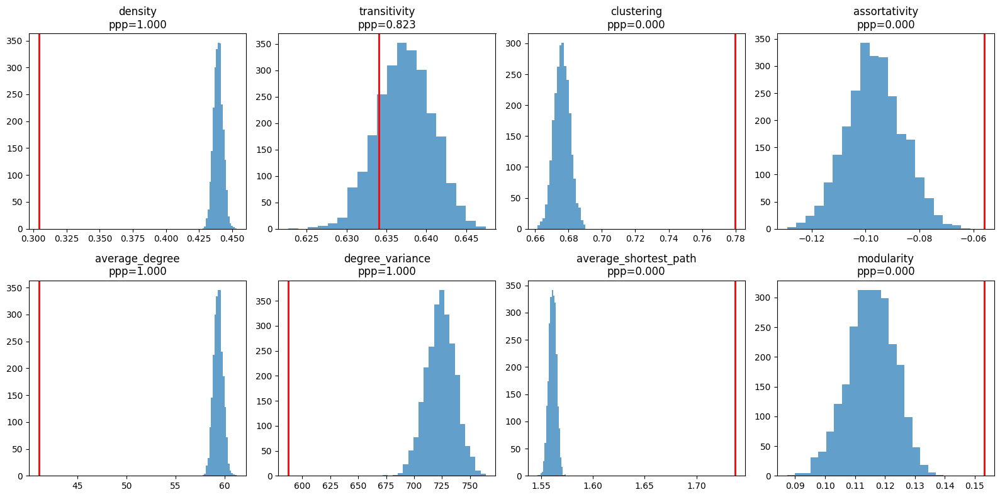

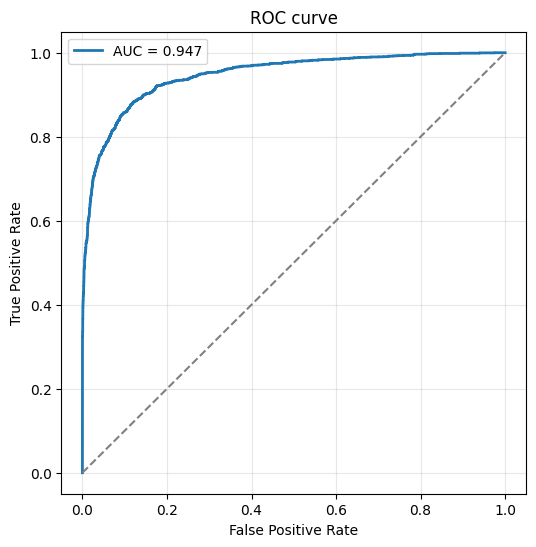

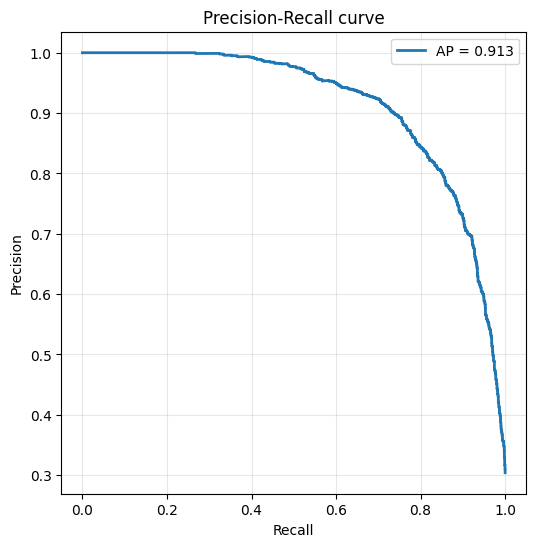

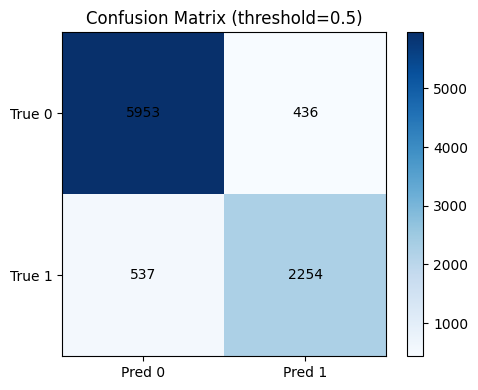

MAP:  26%|██▋       | 263/1000 [00:02<00:06, 116.97it/s, logpost=-2082.9939, loglik=-2082.9939, logprior=0.0000, ||grad||=0.0100, patience=49]


{'mean_auc': 0.9405258517913332, 'std_auc': 0.0031670721180406965, 'min_auc': np.float64(0.9349564852679039), 'max_auc': np.float64(0.9441709109455704), 'n_folds': 5}


In [13]:
geometry = EuclideanGeometry(d=3, D = diam)
alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_R3_p.pkl")

## Models over $\mathbb{S}^d$

### Model $\mathbb{S}^1$

#### Without weights

Multi_start (1)


MAP:  78%|███████▊  | 19585/25000 [02:50<00:47, 114.72it/s, logpost=-4231.1694, loglik=-4230.4727, logprior=-0.6966, ||grad||=0.0141, patience=100]


[STOP] Early stopping at iter 19584 (no improvement in 101 steps)

Best log-posterior: -4231.1694


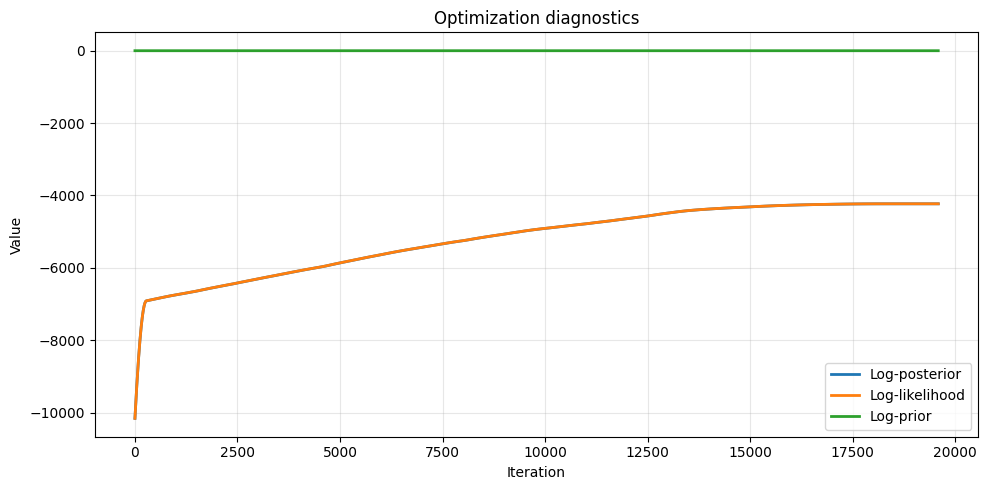

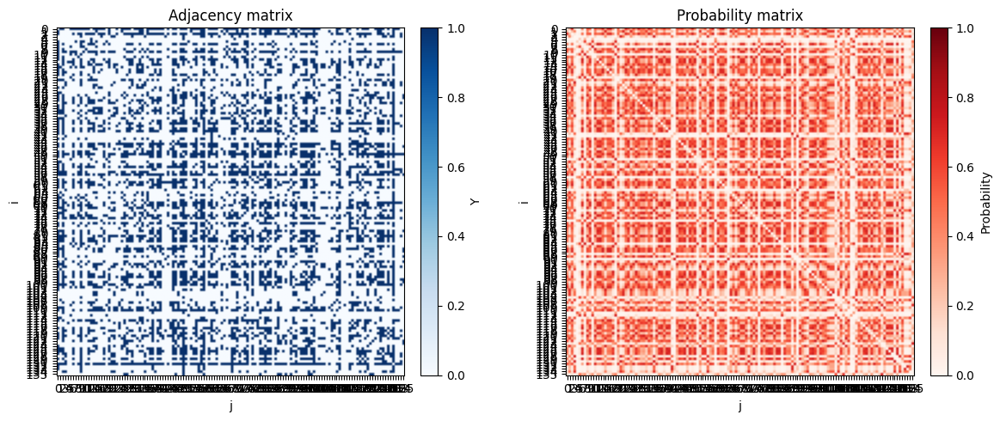

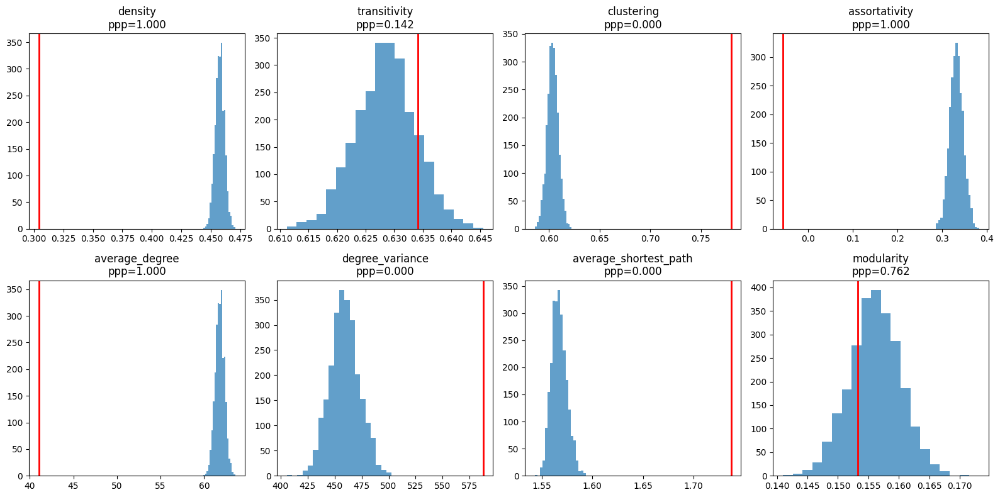

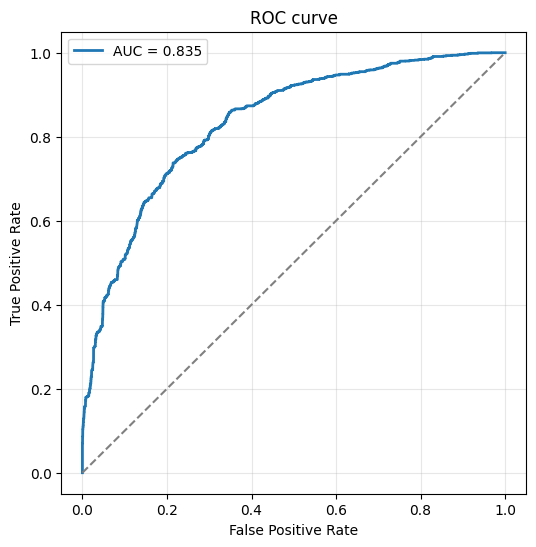

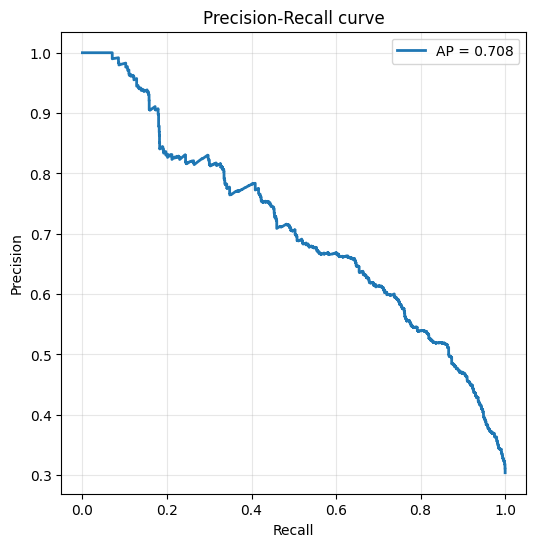

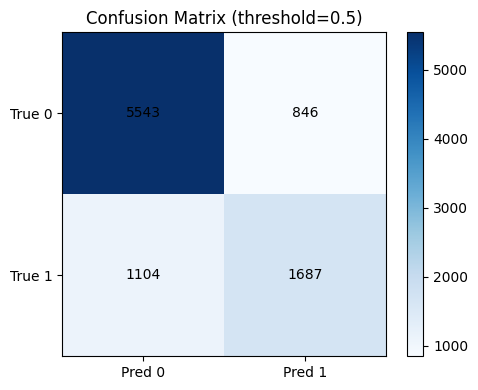

MAP: 100%|██████████| 1000/1000 [00:08<00:00, 120.74it/s, logpost=-3400.8367, loglik=-3400.1370, logprior=-0.6997, ||grad||=0.0141, patience=0]


{'mean_auc': 0.8219588204768545, 'std_auc': 0.011162289909295726, 'min_auc': np.float64(0.8070811925483206), 'max_auc': np.float64(0.8358072350795737), 'n_folds': 5}


In [9]:
geometry = SphericalGeometry(d=1, D=diam)
with open("Conclave_R2_c.pkl", "rb") as f:
    results_R1_c = pickle.load(f)

Z_init = np.zeros((n,2))
Z_init[:,:] = np.asarray(results_R1_c['latent_params']['Z'])
for i in range(n):
    Z_init[i] = geometry.project_to_domain(Z_init[i])
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True, init_params = {"alpha0":0.0,"Z": Z_init})

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_S1_c.pkl")

alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]

#### With weights

Multi_start (1)


MAP:  35%|███▌      | 8858/25000 [00:42<01:18, 206.31it/s, logpost=-3638.9683, loglik=-3638.9683, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 8857 (no improvement in 101 steps)

Best log-posterior: -3638.9683


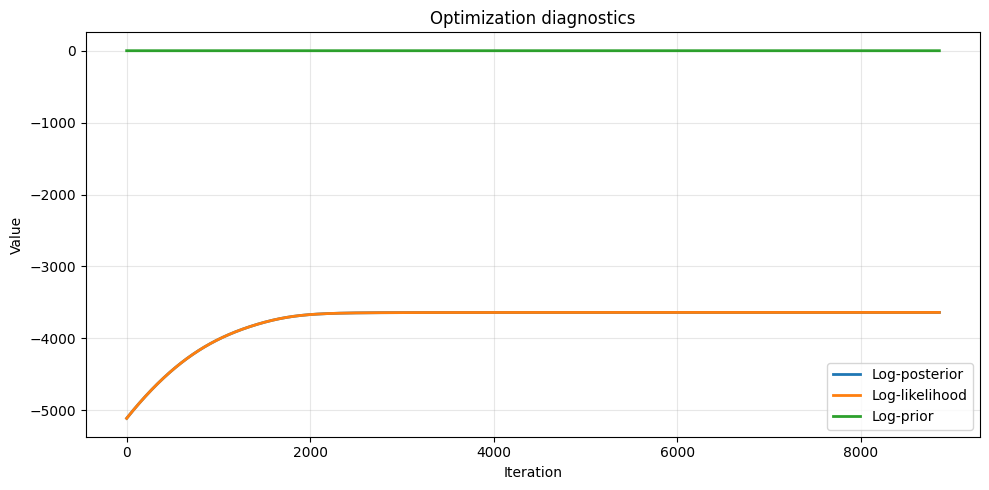

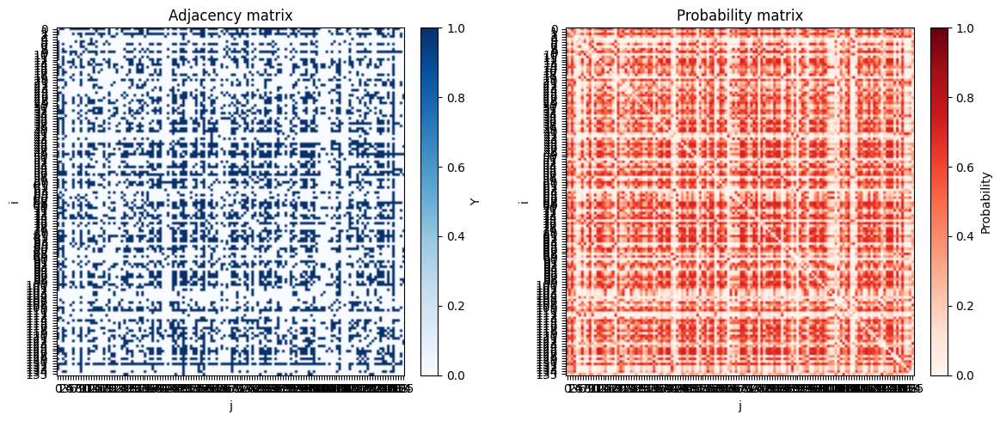

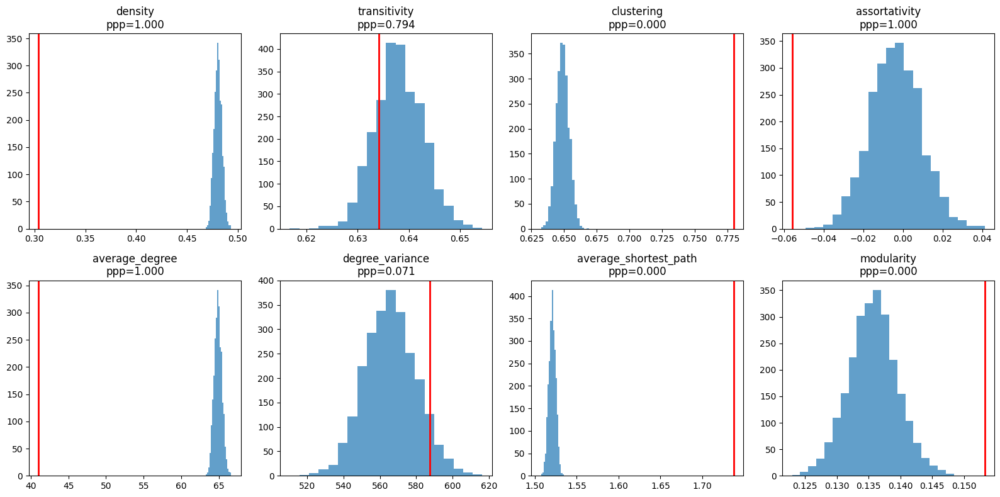

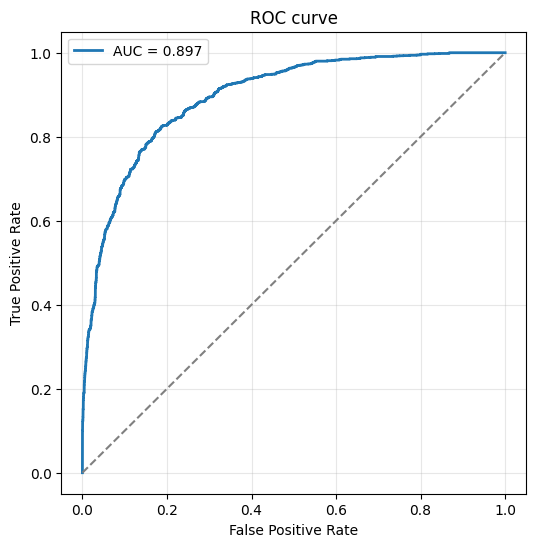

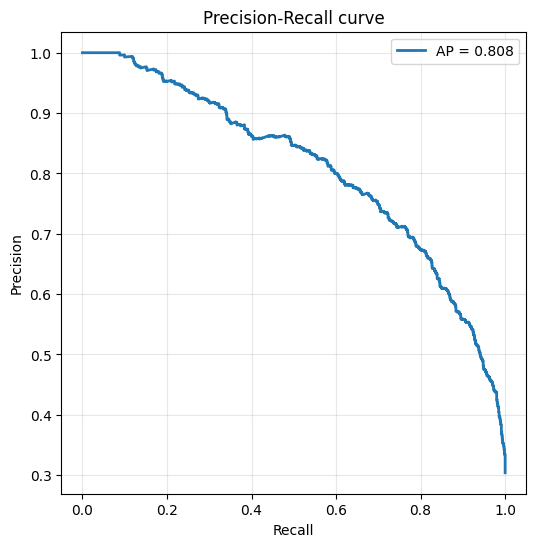

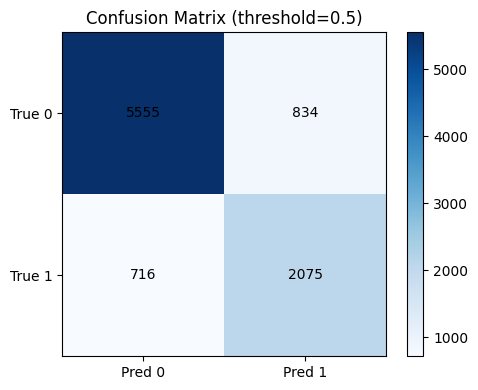

MAP: 100%|██████████| 1000/1000 [00:05<00:00, 180.32it/s, logpost=-2925.7998, loglik=-2925.7998, logprior=0.0000, ||grad||=0.0100, patience=0]


{'mean_auc': 0.8893347649352797, 'std_auc': 0.006073123934606983, 'min_auc': np.float64(0.8812596553773026), 'max_auc': np.float64(0.8982848867593424), 'n_folds': 5}


In [10]:
geometry = SphericalGeometry(d=1, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_S1_p.pkl")

### Model $\mathbb{S}^2$

#### Without weights

In [11]:
with open("Conclave_R3_p.pkl", "rb") as f:
    results_R3_p = pickle.load(f)

Z_init = np.zeros((n,3))
Z_init[:,:] = np.asarray(results_R3_p['latent_params']['Z'])

Multi_start (1)


MAP:  61%|██████    | 15279/25000 [02:09<01:22, 117.81it/s, logpost=-3355.4185, loglik=-3353.9084, logprior=-1.5100, ||grad||=0.0140, patience=100]


[STOP] Early stopping at iter 15278 (no improvement in 101 steps)

Best log-posterior: -3355.4185


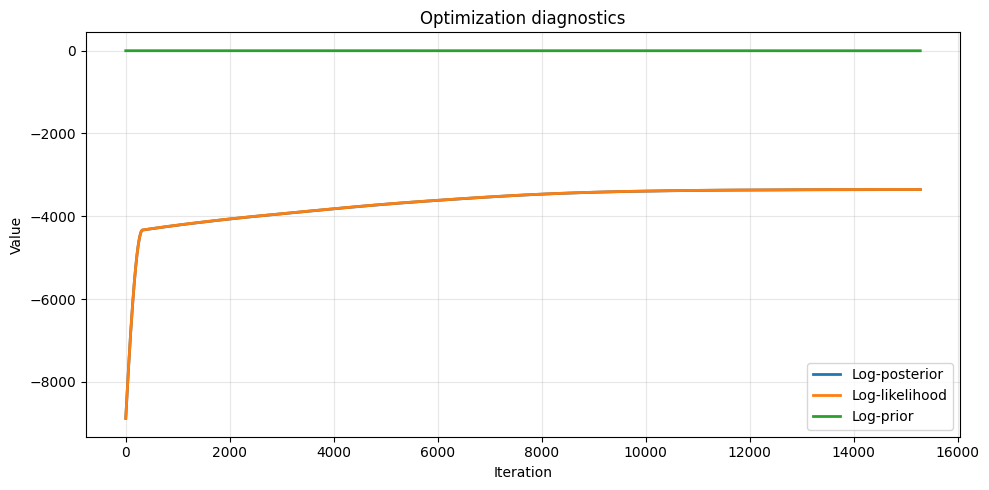

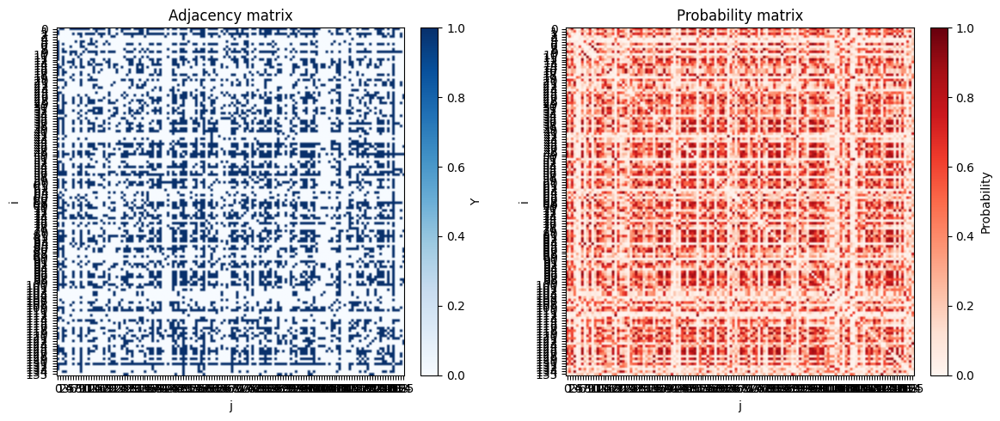

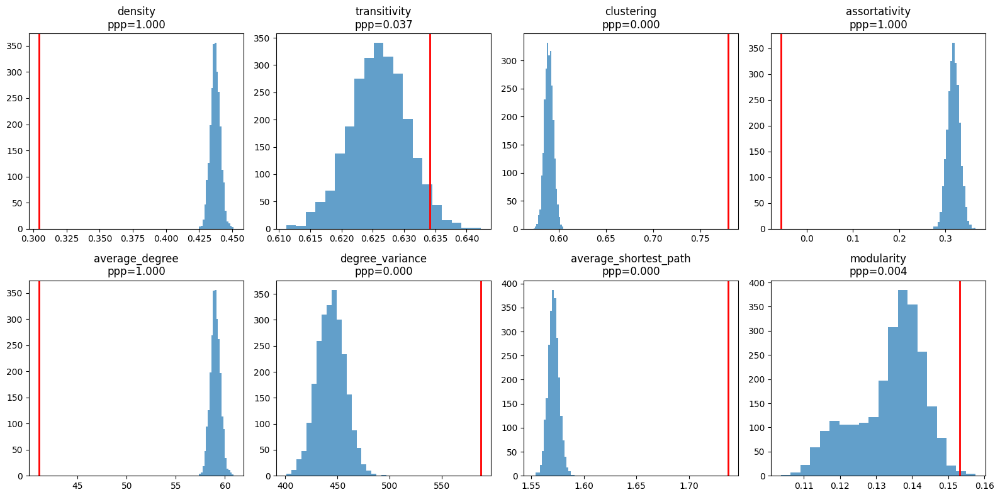

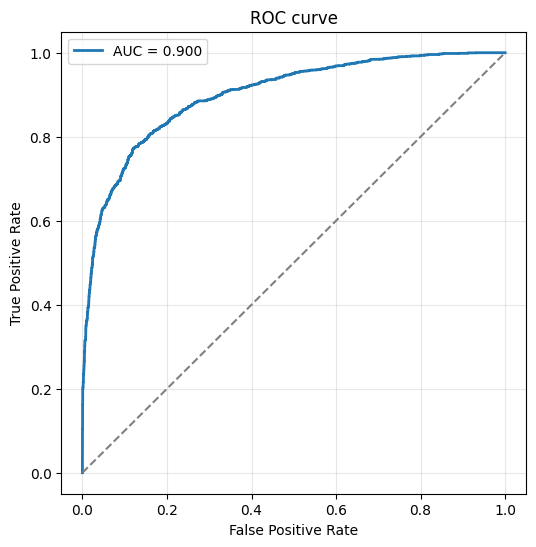

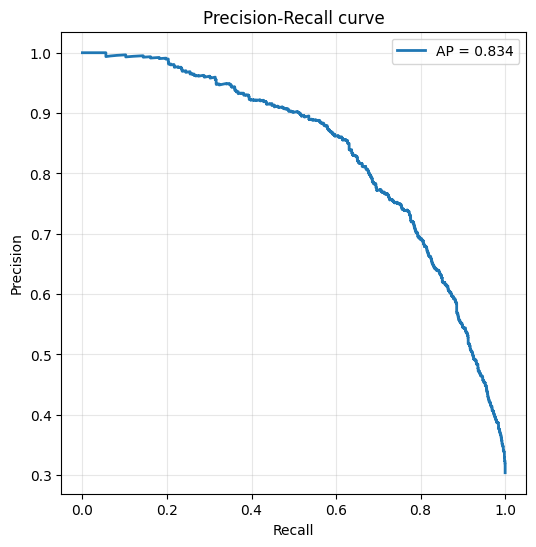

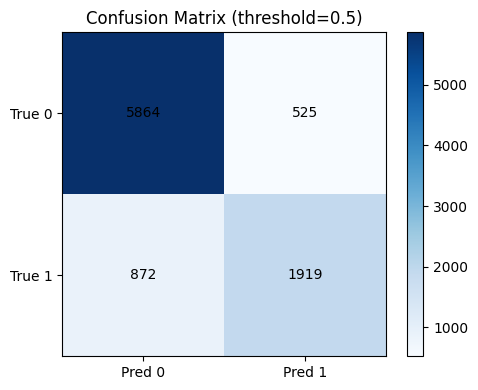

MAP: 100%|██████████| 1000/1000 [00:08<00:00, 116.79it/s, logpost=-2673.6792, loglik=-2672.1411, logprior=-1.5381, ||grad||=0.0141, patience=1]


{'mean_auc': 0.8808188973163998, 'std_auc': 0.008273571753914714, 'min_auc': np.float64(0.8648198245430081), 'max_auc': np.float64(0.8886695540023766), 'n_folds': 5}


In [12]:
geometry = SphericalGeometry(d=2, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True, init_params = {"alpha0":0.0,"Z": Z_init})

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_S2_c.pkl")

alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]

#### With weights

Multi_start (1)


MAP:  18%|█▊        | 4560/25000 [00:26<01:58, 172.87it/s, logpost=-2882.1409, loglik=-2882.1409, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 4559 (no improvement in 101 steps)

Best log-posterior: -2882.1409


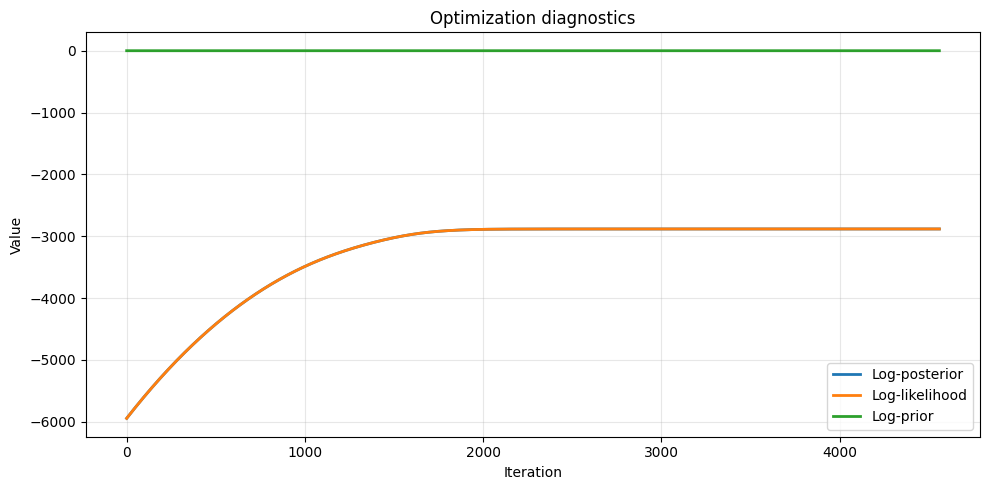

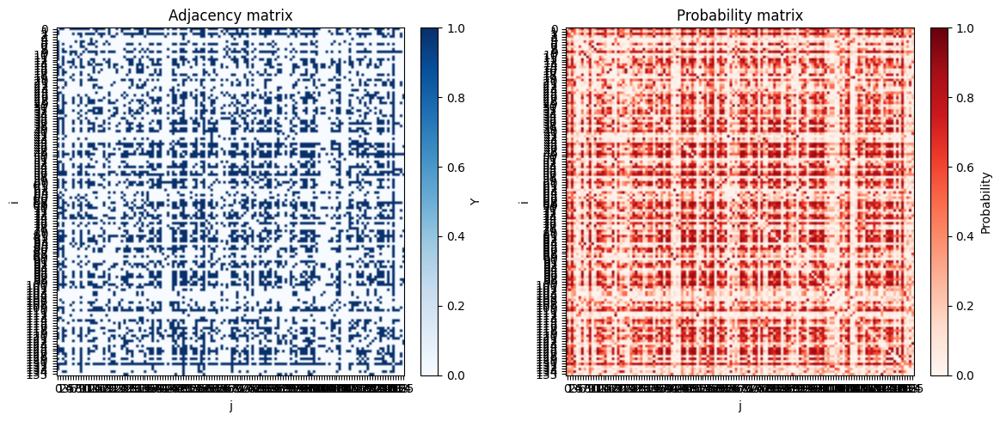

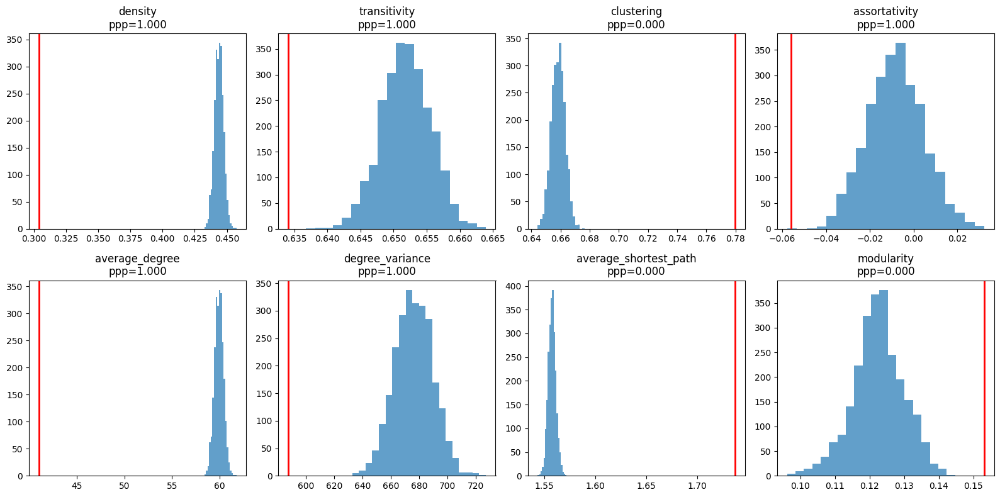

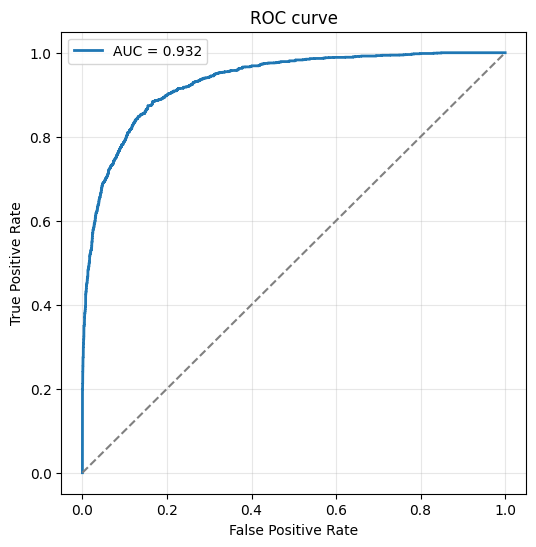

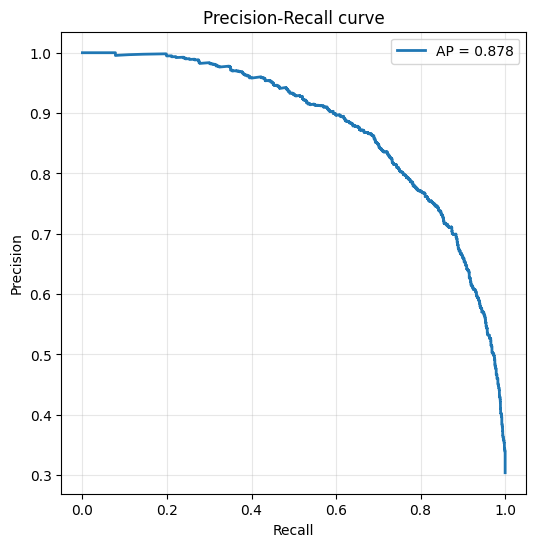

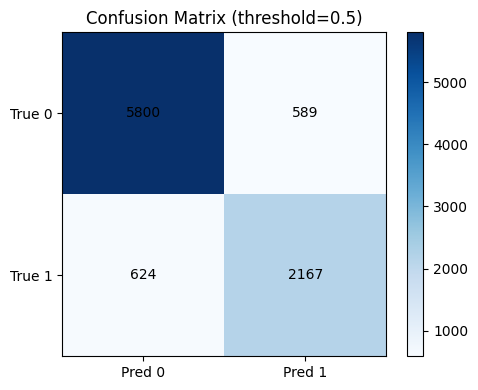

MAP: 100%|██████████| 1000/1000 [00:05<00:00, 169.40it/s, logpost=-2305.7544, loglik=-2305.7544, logprior=0.0000, ||grad||=0.0100, patience=6]


{'mean_auc': 0.9251470615774174, 'std_auc': 0.006889667252852105, 'min_auc': np.float64(0.912179231764007), 'max_auc': np.float64(0.9328159407964768), 'n_folds': 5}


In [13]:
geometry = SphericalGeometry(d=2, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_S2_p.pkl")

## Models over $\mathbb{H}^d$

### Model $\mathbb{H}^1$

#### Without weights

Multi_start (1)


MAP:   1%|          | 148/25000 [00:02<06:32, 63.37it/s, logpost=-4496.8125, loglik=-4496.2231, logprior=-0.5892, ||grad||=0.0141, patience=100] 


[STOP] Early stopping at iter 147 (no improvement in 101 steps)

Best log-posterior: -4496.8125


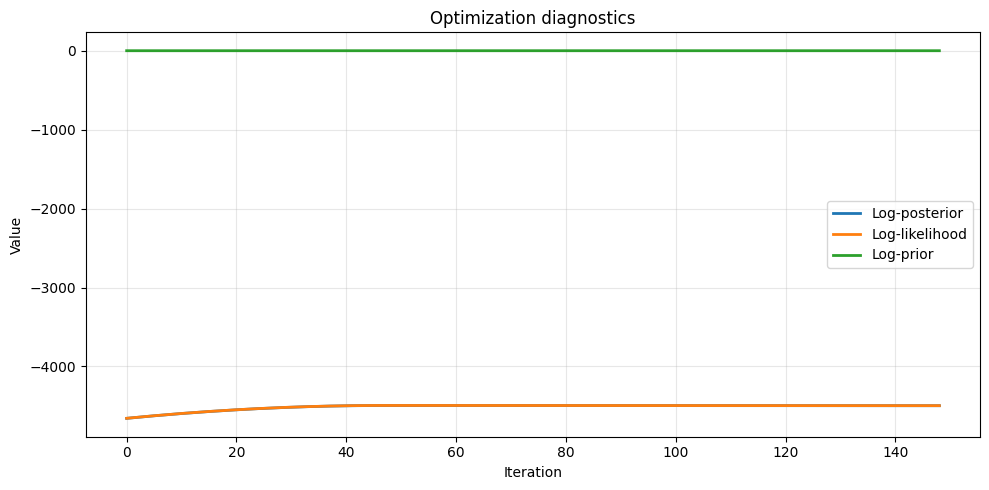

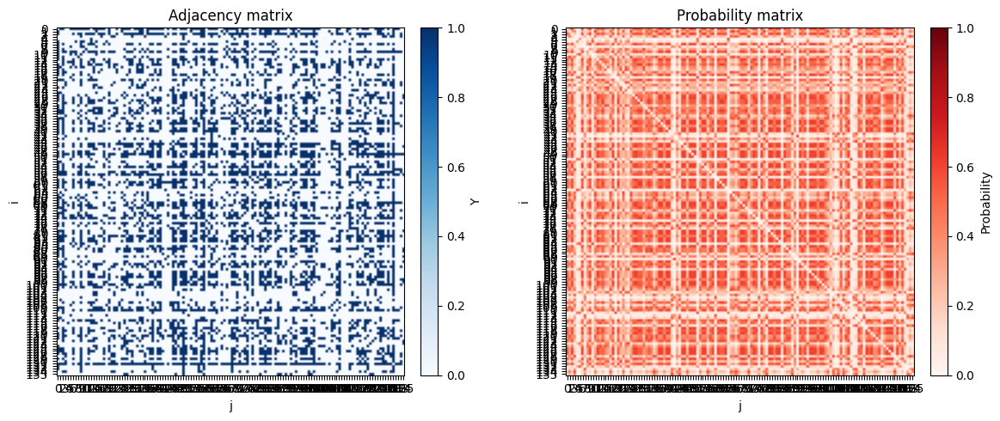

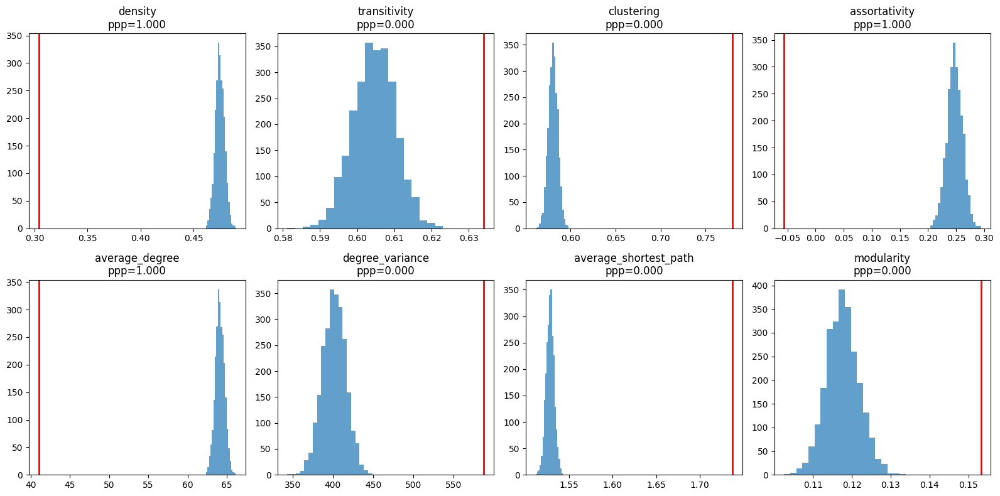

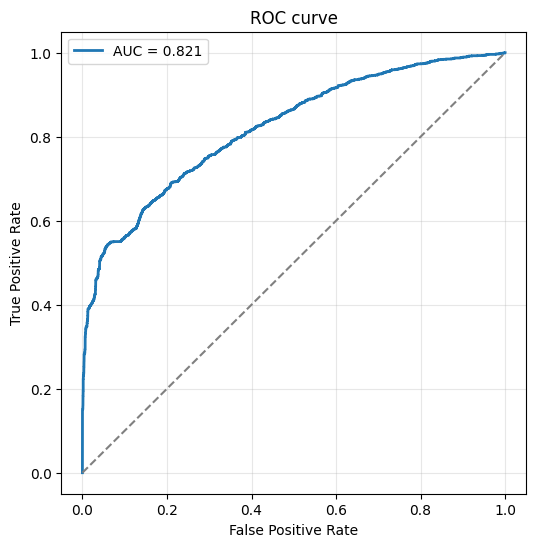

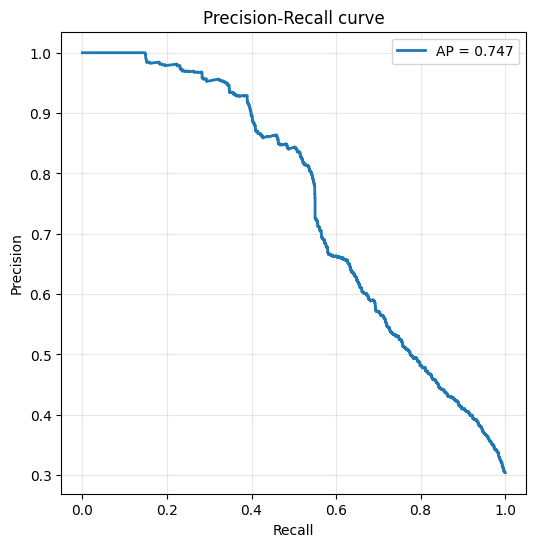

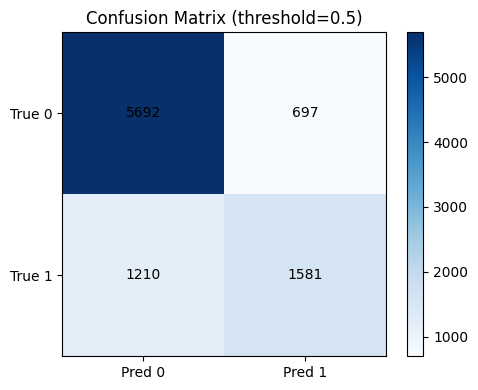

MAP:   5%|▌         | 50/1000 [00:02<00:44, 21.23it/s, logpost=-3608.9834, loglik=-3608.3940, logprior=-0.5893, ||grad||=0.0141, patience=49]


{'mean_auc': 0.8205153854206332, 'std_auc': 0.008143795207901955, 'min_auc': np.float64(0.8052776903987977), 'max_auc': np.float64(0.8275679251406912), 'n_folds': 5}


In [14]:
geometry = HyperbolicGeometry(d=1, D=diam)
with open("Conclave_R1_c.pkl", "rb") as f:
    results_R1_c = pickle.load(f)
Z_init = np.zeros((n,2))
Z_init[:,0:1] = np.asarray(results_R1_c['latent_params']['Z'])
for i in range(n):
    Z_init[i] = geometry.project_to_domain(Z_init[i])
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True, init_params = {"alpha0":0.0,"Z": Z_init})

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_H1_c.pkl")

alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]

#### With weights

Multi_start (1)


MAP:  34%|███▍      | 8616/25000 [01:27<02:47, 97.94it/s, logpost=-4166.1636, loglik=-4166.1636, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 8615 (no improvement in 101 steps)

Best log-posterior: -4166.1636


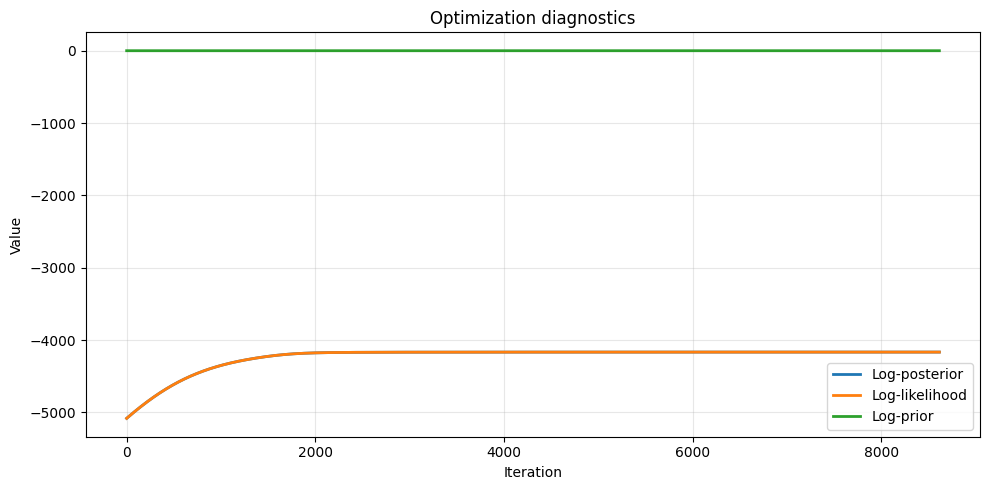

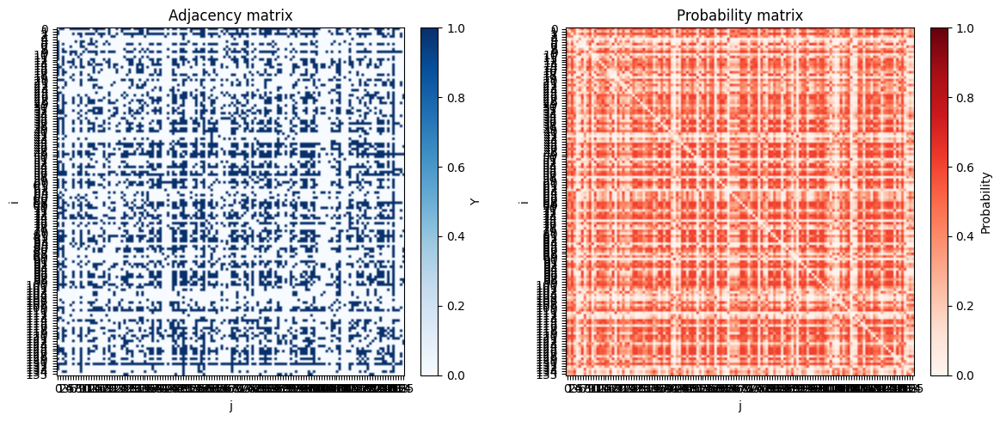

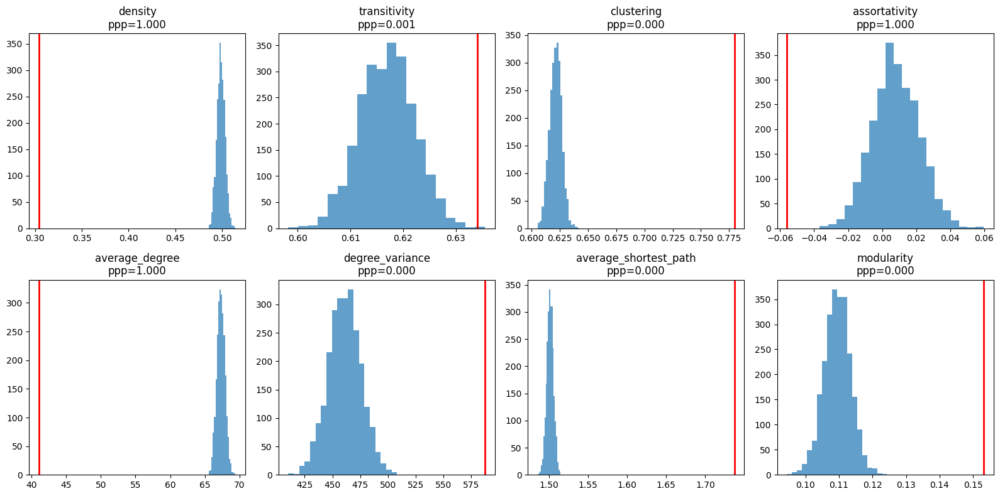

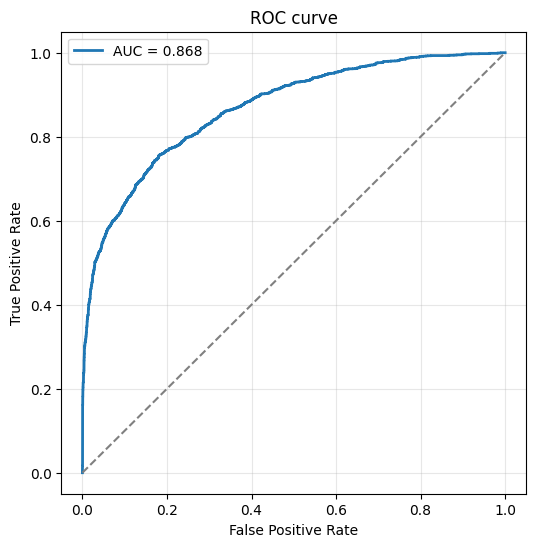

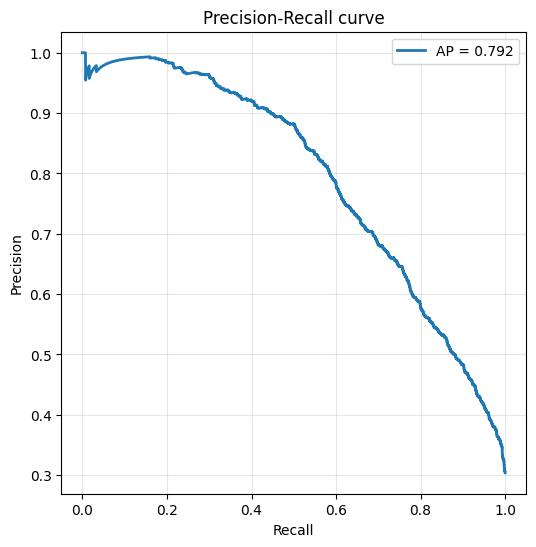

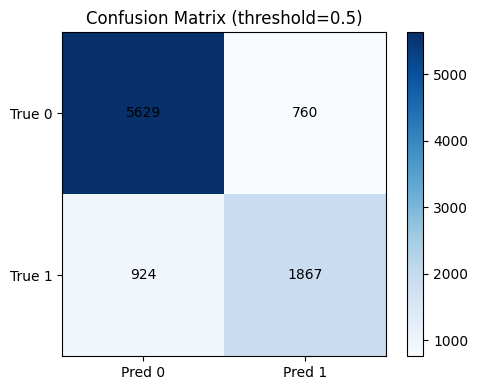

MAP: 100%|██████████| 1000/1000 [00:04<00:00, 235.29it/s, logpost=-3329.3306, loglik=-3329.3306, logprior=0.0000, ||grad||=0.0100, patience=1]


{'mean_auc': 0.8593078058812118, 'std_auc': 0.009284408774297391, 'min_auc': np.float64(0.8441913949180385), 'max_auc': np.float64(0.8697684301439645), 'n_folds': 5}


In [15]:
geometry = HyperbolicGeometry(d=1, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_H1_p.pkl")

### Model $\mathbb{H}^2$

#### Without weights

Multi_start (1)


MAP:  17%|█▋        | 4242/25000 [00:24<01:59, 173.04it/s, logpost=-3398.1304, loglik=-3396.7329, logprior=-1.3974, ||grad||=0.0141, patience=100]


[STOP] Early stopping at iter 4241 (no improvement in 101 steps)

Best log-posterior: -3398.1304


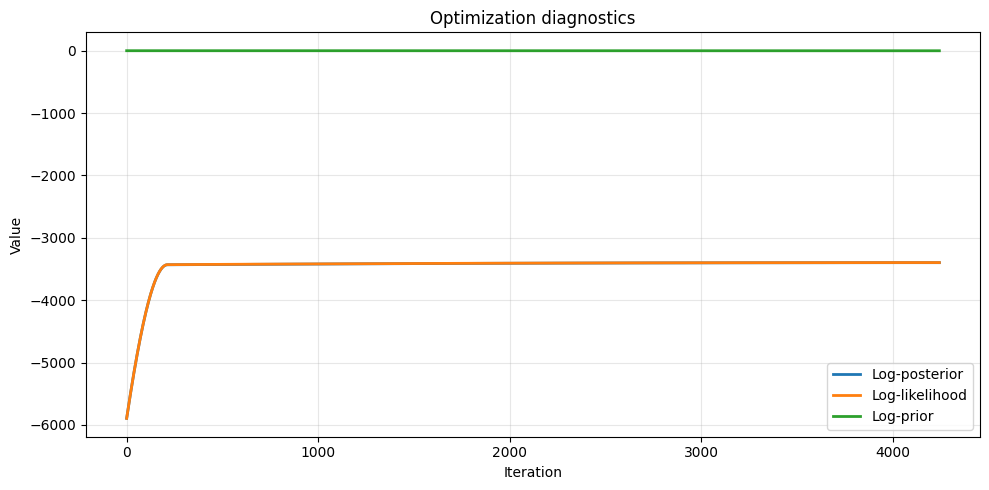

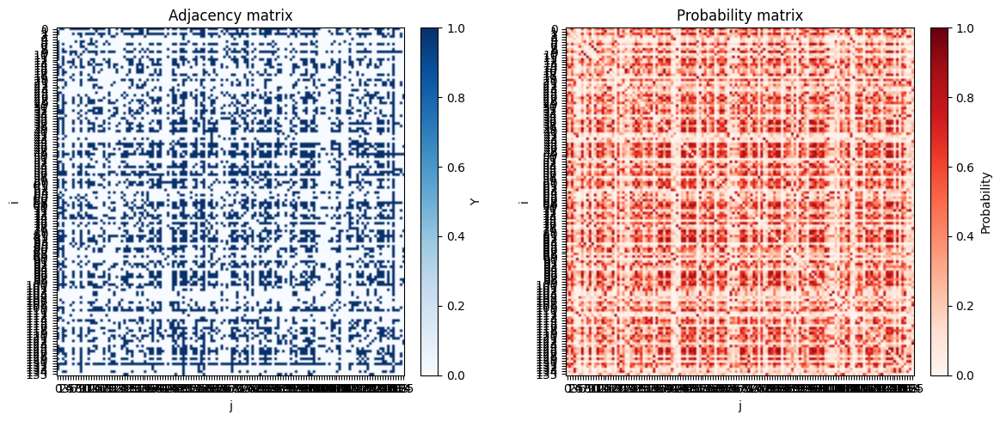

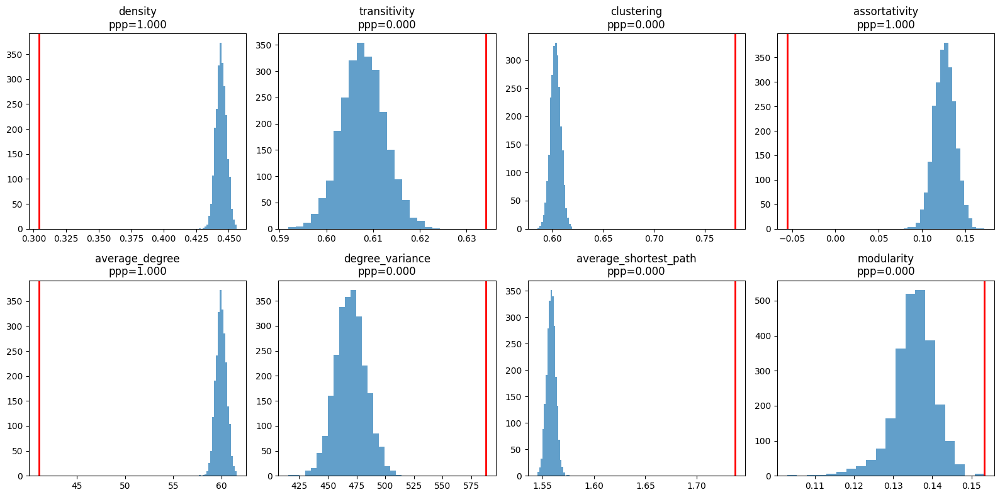

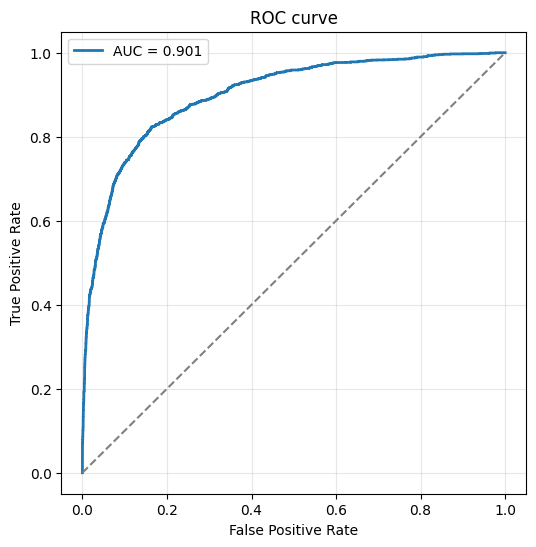

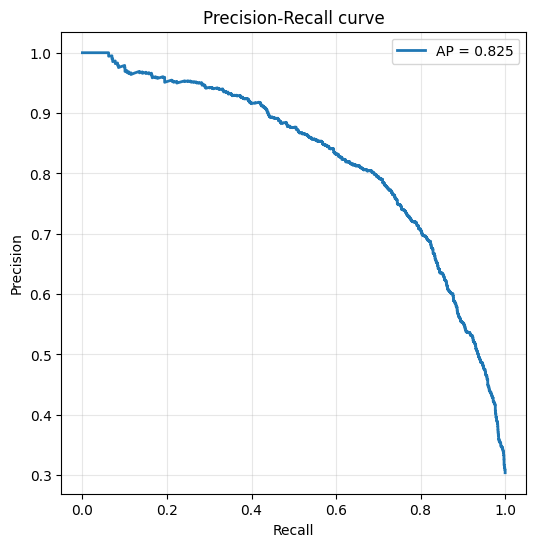

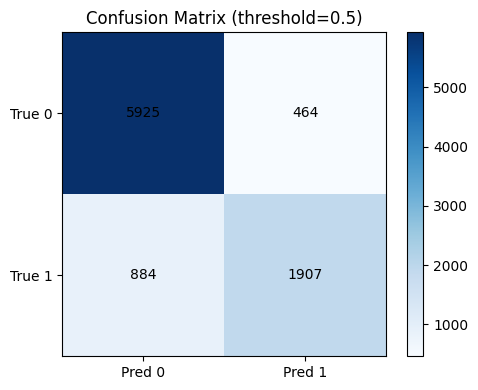

MAP:   5%|▌         | 52/1000 [00:01<00:20, 47.22it/s, logpost=-2732.6899, loglik=-2731.2637, logprior=-1.4263, ||grad||=0.0141, patience=49]


{'mean_auc': 0.9010464182555704, 'std_auc': 0.005777411160424176, 'min_auc': np.float64(0.8929083219740659), 'max_auc': np.float64(0.9084241477382125), 'n_folds': 5}


In [16]:
geometry = HyperbolicGeometry(d=2, D=diam)
with open("Conclave_R2_p.pkl", "rb") as f:
    results_R2_p = pickle.load(f)
Z_init = np.zeros((n,3))
Z_init[:,0:2] = np.asarray(results_R2_p['latent_params']['Z'])
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"xi": np.ones(n)})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True, init_params = {"alpha0":0.0,"Z": Z_init})

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_H2_c.pkl")

alpha0 = model.inferred["MAP"]["final_params"]["alpha0"]
Z = model.inferred["MAP"]["final_params"]["Z"]

#### With weights

Multi_start (1)


MAP:  21%|██▏       | 5322/25000 [00:19<01:11, 276.01it/s, logpost=-3052.1653, loglik=-3052.1653, logprior=0.0000, ||grad||=0.0100, patience=100]


[STOP] Early stopping at iter 5321 (no improvement in 101 steps)

Best log-posterior: -3052.1653


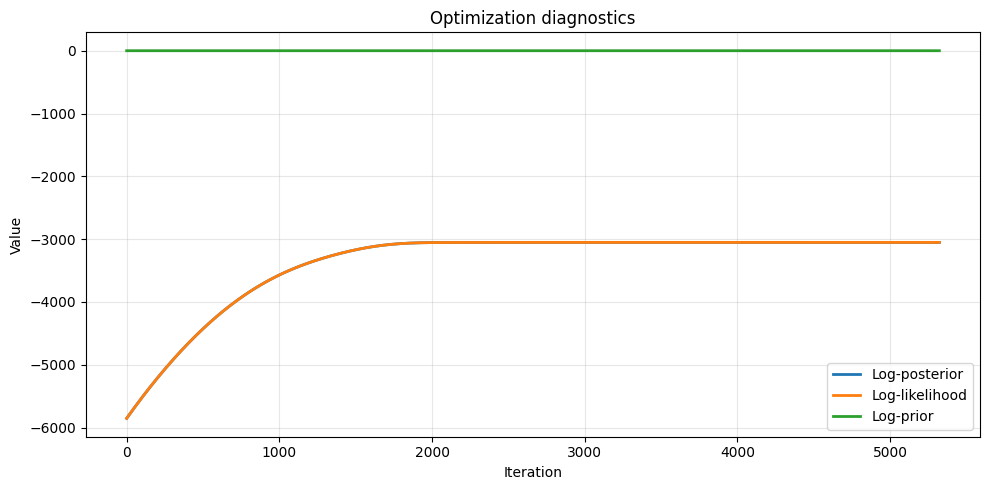

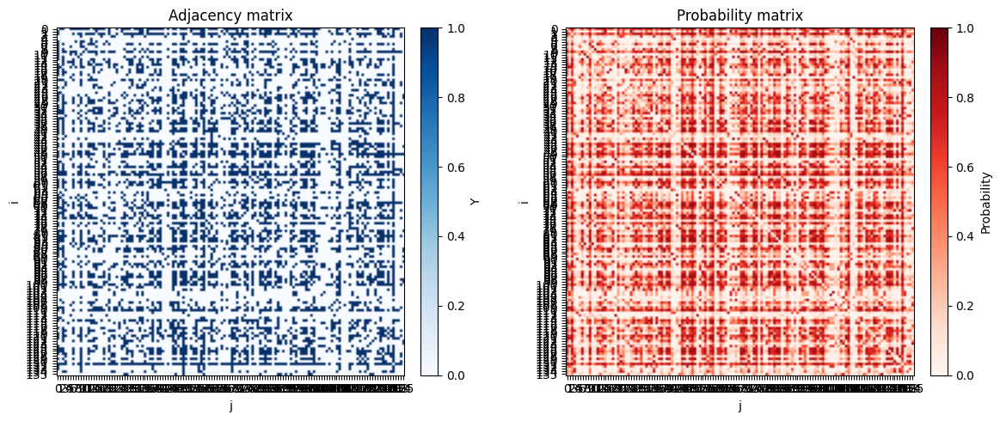

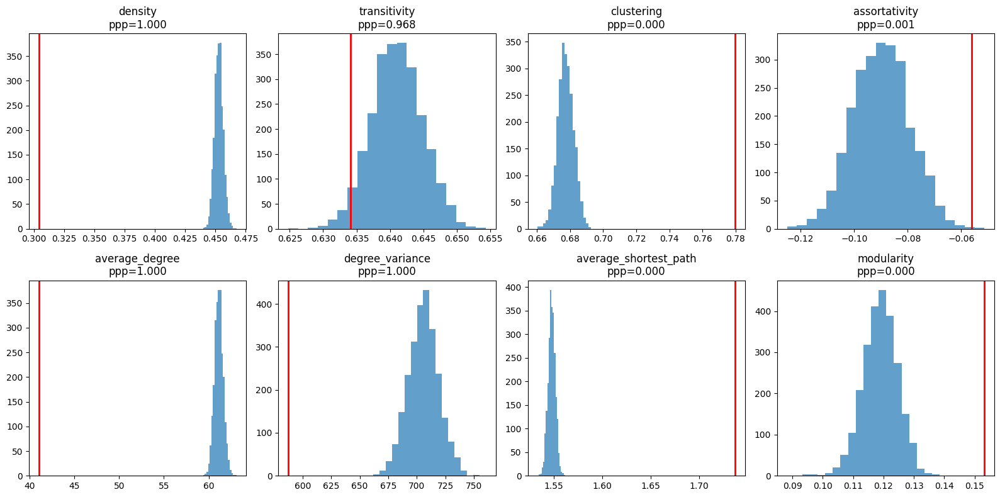

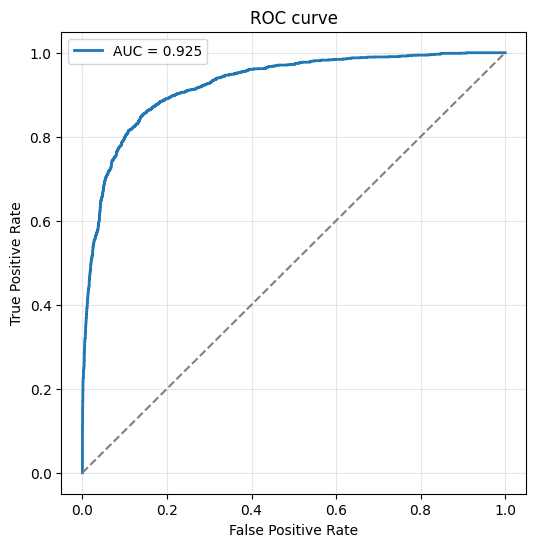

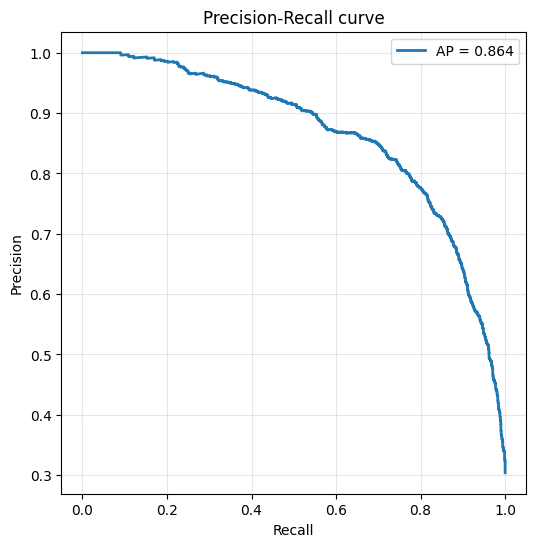

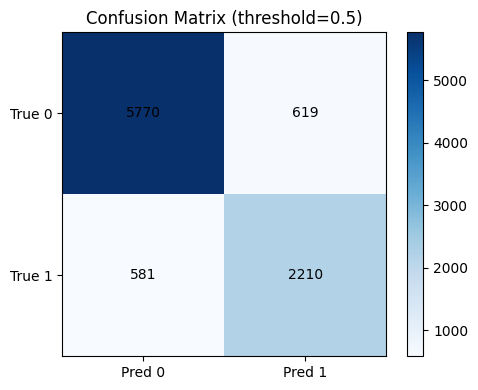

MAP: 100%|██████████| 1000/1000 [00:04<00:00, 214.68it/s, logpost=-2442.8652, loglik=-2442.8652, logprior=0.0000, ||grad||=0.0090, patience=1]


{'mean_auc': 0.9176784026901723, 'std_auc': 0.006206379039140115, 'min_auc': np.float64(0.9084128482052357), 'max_auc': np.float64(0.9260923858929152), 'n_folds': 5}


In [17]:
geometry = HyperbolicGeometry(d=2, D=diam)
model = LatentSpaceModel(Y=Y, geometry=geometry, fixed_params={"Z": Z, "alpha0": alpha0})
inference = MAPInference(model, lr=lr_MAP)
result = inference.fit_multi_start(n_starts=n_starts_MAP, n_iter=n_iter_MAP, verbose=True, use_tqdm=True)

analysis = ModelAnalysis(model,inference_key="MAP")
analysis.plot_logposterior_trace()
analysis.compare_with_adjacency(analysis.P,title="Probability matrix")
analysis.internal_validation(n_sim=n_sim_iv)
analysis.plot_ppc_distributions()
analysis.laplacian_validation() 
analysis.binary_prediction_metrics()
analysis.plot_roc_curve()
analysis.plot_precision_recall_curve()
analysis.confusion_matrix(threshold=0.5)
analysis.cross_validation(n_folds=n_folds_cv, seed=seed_MAP, n_iter=n_iter_cv, lr=0.9*lr_MAP)
print(analysis.cross_validation_summary())

model.save("Conclave_H2_p.pkl")

## Results

### Centrality

In [8]:

import pickle
import numpy as np
models = {
    ("Euclidean", 1, "Classical"): "Conclave_R1_c.pkl",
    ("Euclidean", 1, "Weighted") : "Conclave_R1_p.pkl",
    ("Euclidean", 2, "Classical"): "Conclave_R2_c.pkl",
    ("Euclidean", 2, "Weighted") : "Conclave_R2_p.pkl",
    ("Spherical", 1, "Classical"): "Conclave_S1_c.pkl",
    ("Spherical", 1, "Weighted") : "Conclave_S1_p.pkl",
    ("Spherical", 2, "Classical"): "Conclave_S2_c.pkl",
    ("Spherical", 2, "Weighted") : "Conclave_S2_p.pkl",
    ("Hyperbolic", 1, "Classical"): "Conclave_H1_c.pkl",
    ("Hyperbolic", 1, "Weighted") : "Conclave_H1_p.pkl",
    ("Hyperbolic", 2, "Classical"): "Conclave_H2_c.pkl",
    ("Hyperbolic", 2, "Weighted") : "Conclave_H2_p.pkl",
}
results = {}
for key, filename in models.items():
    with open(filename, "rb") as f:
        results[key] = pickle.load(f)
print(f"{len(results)} models loaded.")

12 models loaded.


In [13]:

# Degree centrality
degree = nx.degree_centrality(G_num)

# Betweenness centrality
betweenness = nx.betweenness_centrality(
    G_num,
    normalized=True
)

# Closeness centrality
closeness = nx.closeness_centrality(G_num)

# Eigenvector centrality
eigenvector = nx.eigenvector_centrality_numpy(G_num)

# PageRank
pagerank = nx.pagerank(G_num)


centrality_obs = pd.DataFrame({
    "Node": list(G_num.nodes()),
    "Degree": [degree[i] for i in G_num.nodes()],
    "Betweenness": [betweenness[i] for i in G_num.nodes()],
    "Closeness": [closeness[i] for i in G_num.nodes()],
    "Eigenvector": [eigenvector[i] for i in G_num.nodes()],
    "PageRank": [pagerank[i] for i in G_num.nodes()]
})

centrality_obs = centrality_obs.sort_values("Node").reset_index(drop=True)

centrality_obs

,Node,Degree,Betweenness,Closeness,Eigenvector,PageRank
0,0,0.718519,0.039635,0.780347,0.155517,0.016211
1,1,0.207407,0.001684,0.542169,0.045943,0.005428
2,2,0.674074,0.021248,0.754190,0.156170,0.014808
3,3,0.200000,0.006772,0.548780,0.040414,0.006060
4,4,0.029630,0.000000,0.475352,0.007627,0.001711
...,...,...,...,...,...,...
131,131,0.807407,0.047382,0.838509,0.166772,0.017957
132,132,0.081481,0.000000,0.509434,0.025633,0.002706
133,133,0.081481,0.000000,0.509434,0.025633,0.002706
134,134,0.185185,0.000618,0.544355,0.038683,0.005025


In [18]:

centrality_sim = []
for (geometry, dimension, model), fit in results.items():
    # (n_sim, n_nodes, n_nodes)
    Yrep = np.asarray(fit["inferred"]["MAP"]["internal_validation"]["Yrep"])
    n_sim = Yrep.shape[0]
    for sim in tqdm(range(1000)):
        A = np.asarray(Yrep[sim])
        A = (A > 0).astype(int)
        np.fill_diagonal(A, 0)
        G = nx.from_numpy_array(A)
        degree = nx.degree_centrality(G)
        closeness = nx.closeness_centrality(G)
        betweenness = nx.betweenness_centrality(G, normalized=True)
        for node in G.nodes():
            centrality_sim.append({
                "Geometry": geometry,
                "Dimension": dimension,
                "Model": model,
                "Simulation": sim,
                "Node": node,
                "Degree": degree[node],
                "Closeness": closeness[node],
                "Betweenness": betweenness[node],
            })
centrality_sim = pd.DataFrame(centrality_sim)
print(centrality_sim.shape)
centrality_sim.head()

100%|██████████| 1000/1000 [02:36<00:00,  6.38it/s]


(1632000, 8)


,Geometry,Dimension,Model,Simulation,Node,Degree,Closeness,Betweenness
0,Euclidean,1,Classical,0,0,0.600000,0.714286,0.004929
1,Euclidean,1,Classical,0,1,0.518519,0.671642,0.003837
2,Euclidean,1,Classical,0,2,0.548148,0.685279,0.003381
3,Euclidean,1,Classical,0,3,0.444444,0.639810,0.005171
4,Euclidean,1,Classical,0,4,0.022222,0.451505,0.000035


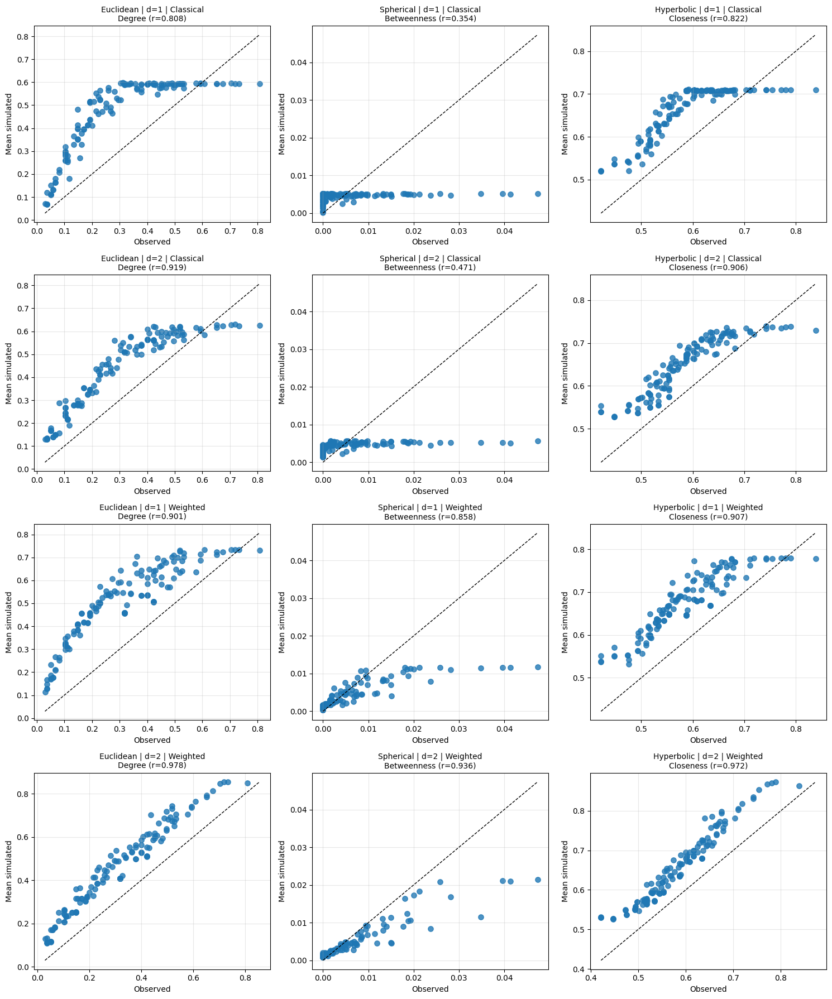

In [27]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==========================================================
# Configuration
# ==========================================================

metrics = ["Degree", "Betweenness", "Closeness"]

geometries = ["Euclidean", "Spherical", "Hyperbolic"]
dimensions = [1, 2]
models = ["Classical", "Weighted"]

fig, axes = plt.subplots(
    len(models) * len(dimensions),
    len(metrics),
    figsize=(15, 18),
    sharex=False,
    sharey=False
)

# ==========================================================
# Scatter plots
# ==========================================================

for r_model, model in enumerate(models):

    for r_dim, dim in enumerate(dimensions):

        row = 2 * r_model + r_dim

        for c, metric in enumerate(metrics):

            ax = axes[row, c]

            # ----------------------------------------------
            # Observed centrality
            # ----------------------------------------------

            obs = centrality_obs[["Node", metric]].rename(
                columns={metric: "Observed"}
            )

            # ----------------------------------------------
            # Mean simulated centrality
            # ----------------------------------------------

            sim = (
                centrality_sim[
                    (centrality_sim["Geometry"] == geometries[c]) &
                    (centrality_sim["Dimension"] == dim) &
                    (centrality_sim["Model"] == model)
                ]
                .groupby("Node")[metric]
                .agg(["mean", "std"])
                .reset_index()
                .rename(columns={
                    "mean": "Simulated",
                    "std": "SD"
                })
            )

            df = obs.merge(sim, on="Node")

            # ----------------------------------------------
            # Scatter
            # ----------------------------------------------

            ax.scatter(
                df["Observed"],
                df["Simulated"],
                s=45,
                alpha=0.8
            )

            # Identity line
            lo = min(df["Observed"].min(), df["Simulated"].min())
            hi = max(df["Observed"].max(), df["Simulated"].max())

            ax.plot(
                [lo, hi],
                [lo, hi],
                "k--",
                lw=1
            )

            # Pearson correlation
            r = np.corrcoef(
                df["Observed"],
                df["Simulated"]
            )[0, 1]

            ax.set_title(
                f"{geometries[c]} | d={dim} | {model}\n"
                f"{metric} (r={r:.3f})",
                fontsize=10
            )

            ax.set_xlabel("Observed")

            ax.set_ylabel("Mean simulated")

            ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [25]:

import numpy as np
import pandas as pd
from scipy.stats import pearsonr, spearmanr

metrics = ["Degree", "Betweenness", "Closeness"]

summary = []

for geometry in ["Euclidean", "Spherical", "Hyperbolic"]:

    for dimension in [1, 2]:

        for model in ["Classical", "Weighted"]:

            for metric in metrics:

                # Centralidad observada
                obs = centrality_obs[["Node", metric]].rename(
                    columns={metric: "Observed"}
                )

                # Distribución simulada
                sim = (
                    centrality_sim[
                        (centrality_sim.Geometry == geometry) &
                        (centrality_sim.Dimension == dimension) &
                        (centrality_sim.Model == model)
                    ]
                    .groupby("Node")[metric]
                    .agg(
                        Mean="mean",
                        SD="std",
                        Low=lambda x: np.percentile(x, 2.5),
                        High=lambda x: np.percentile(x,97.5)
                    )
                    .reset_index()
                )

                df = obs.merge(sim,on="Node")

                # Pearson
                pearson = pearsonr(
                    df["Observed"],
                    df["Mean"]
                )[0]

                # Spearman
                spearman = spearmanr(
                    df["Observed"],
                    df["Mean"]
                )[0]

                # RMSE
                rmse = np.sqrt(
                    np.mean(
                        (df["Observed"]-df["Mean"])**2
                    )
                )

                # Cobertura
                coverage = np.mean(
                    (df["Observed"]>=df["Low"]) &
                    (df["Observed"]<=df["High"])
                )

                summary.append({

                    "Geometry":geometry,
                    "Dimension":dimension,
                    "Model":model,
                    "Metric":metric,

                    "Pearson":pearson,
                    "Spearman":spearman,
                    "RMSE":rmse,
                    "Coverage":coverage

                })

summary = pd.DataFrame(summary)

summary

,Geometry,Dimension,Model,Metric,Pearson,Spearman,RMSE,Coverage
0,Euclidean,1,Classical,Degree,0.808356,0.898494,0.197265,0.088235
1,Euclidean,1,Classical,Betweenness,0.361332,0.601561,0.008498,0.264706
2,Euclidean,1,Classical,Closeness,0.813777,0.895938,0.084545,0.132353
3,Euclidean,1,Weighted,Degree,0.901419,0.938149,0.209034,0.051471
4,Euclidean,1,Weighted,Betweenness,0.878943,0.909454,0.006619,0.330882
5,Euclidean,1,Weighted,Closeness,0.912678,0.936991,0.093509,0.051471
6,Euclidean,2,Classical,Degree,0.919482,0.968062,0.147189,0.080882
7,Euclidean,2,Classical,Betweenness,0.554217,0.770205,0.007819,0.227941
8,Euclidean,2,Classical,Closeness,0.909327,0.968123,0.065952,0.088235
9,Euclidean,2,Weighted,Degree,0.978206,0.978987,0.147351,0.007353


### Laplacian spectrum

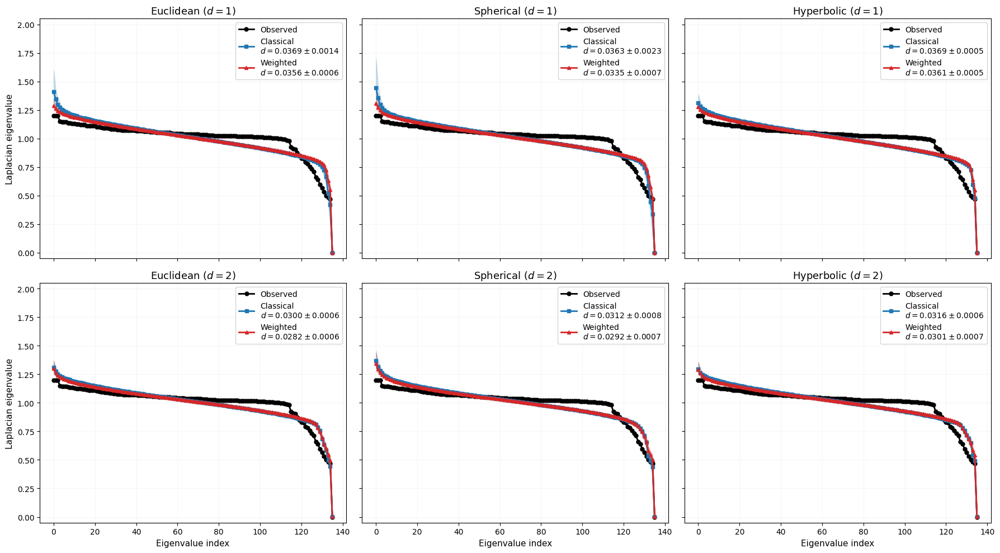

In [23]:

import numpy as np
import matplotlib.pyplot as plt

# ==========================================================
# Dimensions and geometries
# ==========================================================

rows = [1, 2]
cols = ["Euclidean", "Spherical", "Hyperbolic"]

# ==========================================================
# Figure
# ==========================================================

fig, axes = plt.subplots(
    2,
    3,
    figsize=(18, 10),
    sharex=True,
    sharey=True
)

for i, dim in enumerate(rows):
    for j, geom in enumerate(cols):

        ax = axes[i, j]

        # --------------------------------------------------
        # Retrieve models
        # --------------------------------------------------

        classic = results[(geom, dim, "Classical")]
        proposed = results[(geom, dim, "Weighted")]

        lap_c = classic["inferred"]["MAP"]["laplacian_validation"]
        lap_p = proposed["inferred"]["MAP"]["laplacian_validation"]

        # --------------------------------------------------
        # Reverse spectra and clip to [0, 2]
        # --------------------------------------------------

        observed = np.clip(lap_c["observed_spectrum"], 0.0, 2.0)[::-1]
        sim_c = np.clip(lap_c["simulated_spectra"], 0.0, 2.0)[:, ::-1]
        mean_c = sim_c.mean(axis=0)
        low_c  = np.percentile(sim_c, 2.5, axis=0)
        high_c = np.percentile(sim_c,97.5, axis=0)
        sim_p = np.clip(lap_p["simulated_spectra"], 0.0, 2.0)[:, ::-1]
        mean_p = sim_p.mean(axis=0)
        low_p  = np.percentile(sim_p, 2.5, axis=0)
        high_p = np.percentile(sim_p,97.5, axis=0)

        x = np.arange(len(observed))

        # --------------------------------------------------
        # Observed spectrum
        # --------------------------------------------------

        ax.plot(
            x,
            observed,
            "-o",
            color="black",
            lw=2,
            ms=5,
            label="Observed"
        )

        # --------------------------------------------------
        # Classical model
        # --------------------------------------------------

        ax.plot(
            x,
            mean_c,
            "-s",
            color="tab:blue",
            lw=2,
            ms=4,
            label=(
                "Classical\n"
                rf"$d={lap_c['mean_distance']:.4f}"
                r"\pm"
                rf"{lap_c['std_distance']:.4f}$"
            )
        )
        ax.fill_between(
            x,
            low_c,
            high_c,
            color="tab:blue",
            alpha=0.20
        )

        # --------------------------------------------------
        # Weighted model
        # --------------------------------------------------

        ax.plot(
            x,
            mean_p,
            "-^",
            color="tab:red",
            lw=2,
            ms=4,
            label=(
                "Weighted\n"
                rf"$d={lap_p['mean_distance']:.4f}"
                r"\pm"
                rf"{lap_p['std_distance']:.4f}$"
            )
        )

        ax.fill_between(
            x,
            low_p,
            high_p,
            color="tab:red",
            alpha=0.20
        )

        # --------------------------------------------------
        # Formatting
        # --------------------------------------------------

        ax.set_title(
            f"{geom} ($d={dim}$)",
            fontsize=13
        )


        ax.set_ylim(-0.05, 2.05)

        ax.grid(alpha=0.10)

        if i == 1:
            ax.set_xlabel("Eigenvalue index", fontsize=11)

        if j == 0:
            ax.set_ylabel("Laplacian eigenvalue", fontsize=11)

        ax.legend(
            fontsize=10,
            frameon=True,
            loc="best"
        )

plt.tight_layout()
plt.show()

### Summary metrics

In [20]:

import pandas as pd

# =====================================================
# Build summary table
# =====================================================

rows = []

for (geometry, dimension, model), res in results.items():

    infer = res["inferred"]["MAP"]

    row = {
        "Geometry": geometry,
        "Dimension": dimension,
        "Model": model,
        "Log-Likelihood": infer["final_loglik"],
        "Log-Posterior": infer["final_logpost"],
        "BIC": infer["BIC"],
        "ROC AUC": infer["binary_prediction"]["metrics"]["roc_auc"],
        "CV Mean AUC": infer["cross_validation"]["mean_auc"],
        "CV Std AUC": infer["cross_validation"]["std_auc"],
        "Laplacian Mean Distance": infer["laplacian_validation"]["mean_distance"],
        "Laplacian Std Distance": infer["laplacian_validation"]["std_distance"],
    }

    rows.append(row)

# =====================================================
# DataFrame
# =====================================================

table = pd.DataFrame(rows)

# Order rows
geometry_order = {
    "Euclidean": 0,
    "Spherical": 1,
    "Hyperbolic": 2,
}

model_order = {
    "Classical": 0,
    "Weighted": 1,
}

table["g_order"] = table["Geometry"].map(geometry_order)
table["m_order"] = table["Model"].map(model_order)

table = (
    table
    .sort_values(["g_order", "Dimension", "m_order"])
    .drop(columns=["g_order", "m_order"])
    .reset_index(drop=True)
)

# =====================================================
# Round numbers
# =====================================================

table = table.round({
    "Log-Likelihood": 3,
    "Log-Posterior": 3,
    "BIC": 3,
    "ROC AUC": 3,
    "CV Mean AUC": 3,
    "CV Std AUC": 3,
    "Laplacian Mean Distance": 4,
    "Laplacian Std Distance": 4,
})

# =====================================================
# Display
# =====================================================

display(table)

,Geometry,Dimension,Model,Log-Likelihood,Log-Posterior,BIC,ROC AUC,CV Mean AUC,CV Std AUC,Laplacian Mean Distance,Laplacian Std Distance
0,Euclidean,1,Classical,-4472.104,-4472.704,10194.304,0.826,0.813,0.010,0.0369,0.0014
1,Euclidean,1,Weighted,-4113.674,-4113.674,9468.318,0.870,0.861,0.009,0.0356,0.0006
2,Euclidean,2,Classical,-3363.406,-3364.992,9217.879,0.899,0.881,0.007,0.0300,0.0006
3,Euclidean,2,Weighted,-3001.402,-3001.402,7243.774,0.925,0.918,0.006,0.0282,0.0006
4,Spherical,1,Classical,-4230.473,-4231.169,9711.041,0.835,0.822,0.011,0.0363,0.0023
5,Spherical,1,Weighted,-3638.968,-3638.968,8518.907,0.897,0.889,0.006,0.0335,0.0007
6,Spherical,2,Classical,-3353.908,-3355.418,9198.883,0.900,0.881,0.008,0.0312,0.0008
7,Spherical,2,Weighted,-2882.141,-2882.141,7005.252,0.932,0.925,0.007,0.0292,0.0007
8,Hyperbolic,1,Classical,-4496.223,-4496.812,10242.541,0.821,0.821,0.008,0.0369,0.0005
9,Hyperbolic,1,Weighted,-4166.164,-4166.164,9573.298,0.868,0.859,0.009,0.0361,0.0005
